<a href="https://colab.research.google.com/github/foxtrotmike/CS909/blob/master/DataMining2024_assignment_2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Data Mining Assignment 2

In [1]:
import warnings
warnings.filterwarnings(action="ignore", category=FutureWarning)

In [2]:
from skimage.color import rgb2hed
import skimage
from skimage.io import imread
from skimage.color import rgba2rgb
import matplotlib.pyplot as plt

import os
import glob

In [3]:
# image_folder = os.path.join(os.getcwd(), 'content', 'patches_256')
image_folder = 'content/patches_256/'

In [4]:
# !wget https://warwick.ac.uk/fac/sci/dcs/teaching/material/cs909/patches_256.zip
# !unzip patches_256.zip -d /content/

### Question No. 1: (Data Analysis) 

In [5]:
import pandas as pd
import os

# df = pd.read_csv('https://warwick.ac.uk/fac/sci/dcs/teaching/material/cs909/protein_expression_data.csv')
df = pd.read_csv(os.path.join(os.getcwd(), 'protein_expression_data.csv'))

df['specimen_id']=df.VisSpot.apply(lambda x: x.split('-')[2]) #create specimen id field
df['image_id']=df.VisSpot.apply(lambda x: x.split('-')[2])+'_'+df.id #create image id field
df = df.set_index('image_id').sort_index()
protein_names = ['SMAa', 'CD11b',
       'CD44', 'CD31', 'CDK4', 'YKL40', 'CD11c', 'HIF1a', 'CD24', 'TMEM119',
       'OLIG2', 'GFAP', 'VISTA', 'IBA1', 'CD206', 'PTEN', 'NESTIN', 'TCIRG1',
       'CD74', 'MET', 'P2RY12', 'CD163', 'S100B', 'cMYC', 'pERK', 'EGFR',
       'SOX2', 'HLADR', 'PDGFRa', 'MCT4', 'DNA1', 'DNA3', 'MHCI', 'CD68',
       'CD14', 'KI67', 'CD16', 'SOX10']
print(df)


          Unnamed: 0                VisSpot  Location_Center_Y  \
image_id                                                         
A1_0x40          412  AAGTAAGCTTCCAAAC-1-A1         764.003658   
A1_0x42         7325  GTTTGAGCGGTTATGT-1-A1         799.511111   
A1_0x44         8102  TCACTCAGCGCATTAG-1-A1         832.902467   
A1_0x46         7085  GTGCGCTTACAAATGA-1-A1         858.343544   
A1_0x48         3748  CGAAGACTGCCCGGGA-1-A1         892.179831   
...              ...                    ...                ...   
D1_9x63         3609  CCTCCCGACAATCCCT-1-D1         123.760525   
D1_9x65          172  AACACGACTGTACTGA-1-D1          29.281573   
D1_9x67         2686  CACCGCCGACCAGCGA-1-D1         938.403662   
D1_9x69         2813  CAGAGTGATTTAACGT-1-D1         844.093656   
D1_9x71         6877  GTCAGTTGTGCTCGTT-1-D1         740.107483   

          Location_Center_X      SMAa     CD11b      CD44      CD31      CDK4  \
image_id                                                    

In [6]:
df.columns

Index(['Unnamed: 0', 'VisSpot', 'Location_Center_Y', 'Location_Center_X',
       'SMAa', 'CD11b', 'CD44', 'CD31', 'CDK4', 'YKL40', 'CD11c', 'HIF1a',
       'CD24', 'TMEM119', 'OLIG2', 'GFAP', 'VISTA', 'IBA1', 'CD206', 'PTEN',
       'NESTIN', 'TCIRG1', 'CD74', 'MET', 'P2RY12', 'CD163', 'S100B', 'cMYC',
       'pERK', 'EGFR', 'SOX2', 'HLADR', 'PDGFRa', 'MCT4', 'DNA1', 'DNA3',
       'MHCI', 'CD68', 'CD14', 'KI67', 'CD16', 'SOX10', 'id', 'specimen_id'],
      dtype='object')

#### i. Counting Examples: Determine the number of "examples" or spots present in each specimen.


In [7]:
unique_spots = df.groupby(['specimen_id'])['id'].count()
print("Number of spots in each specimen\n", unique_spots)

Number of spots in each specimen
 specimen_id
A1    2894
B1    1145
C1    4129
D1    1753
Name: id, dtype: int64


#### ii. Protein Expression Histograms: For each specimen, generate histograms to visualize the expression values of 'NESTIN', 'cMYC', and 'MET' and discuss your observations. 

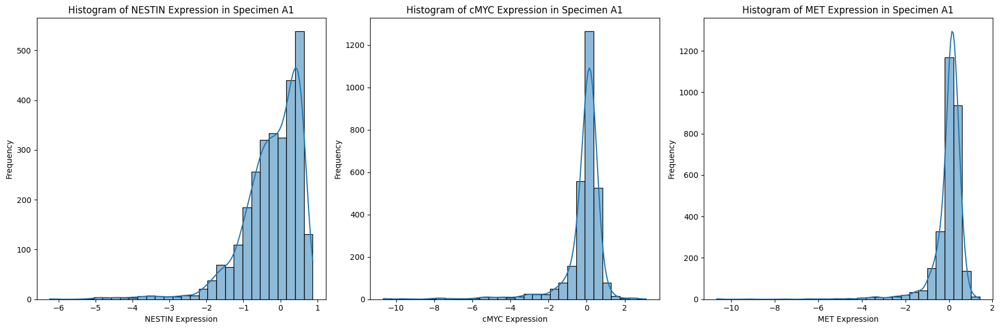

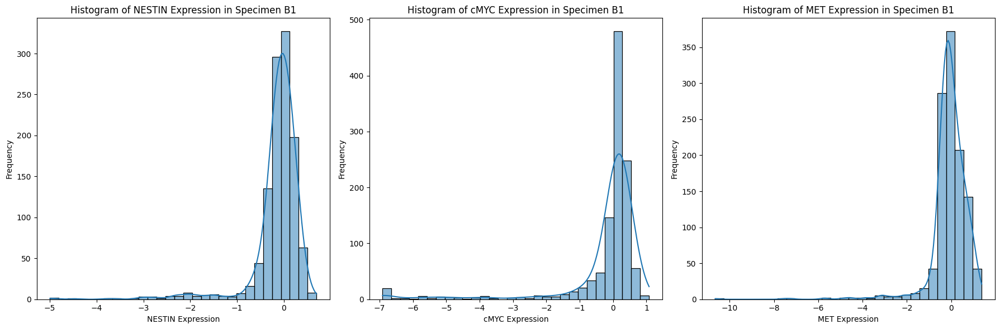

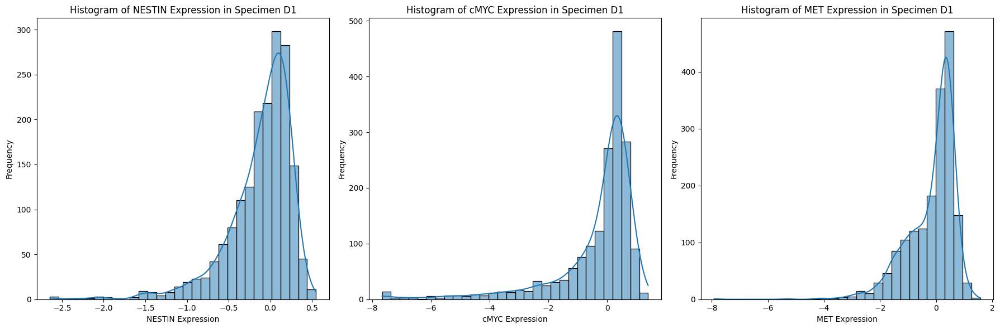

In [8]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

proteins = ['NESTIN', 'cMYC', 'MET']

for specimen in ['A1', 'B1', 'D1']:
    specimen_data = df[df['specimen_id'] == specimen]

    plt.figure(figsize=(18, 6))

    for i, protein in enumerate(proteins):
        plt.subplot(1, len(proteins), i + 1)
        sns.histplot(specimen_data[protein], kde=True, bins=30)
        plt.title(f'Histogram of {protein} Expression in Specimen {specimen}')
        plt.xlabel(f'{protein} Expression')
        plt.ylabel('Frequency')

    plt.tight_layout()    
    plt.show()

##### **Observations:**

- The expression levels of cMYC appears to be more consistent across all the samples in A1, B1 and D1. This is more prominently indicated by their peaks.
- **For NESTIN Expression:**  The histograms exhibit left-skewness across all the expressions. For specimen A1, the distribution appears to be concentrated towards the end and having a peak close to 0. For speciment B1, the distribution is slightly broad. And lastly, for the specimen D1, there is high frequency of speciments close to 0 which show that **higher expression levels are common for NESTIN in this specimen**.
- **For cMYC Expression:** The expression levels are tightly clustered around 0 for all the specimens with very sharp peaks. This shows that there is little variation among the specimen levels for this expression.
- **For MET Expression:** The histograms show a peak close to 0 with rapid drop off to the right side. The data suggests that there are fewer outliers for this expression.

- The NESTIN and MET show **left-skewness** among all the specimens which show that there is frequent occurence of higher expression levels.
- None of the expression histograms show an un-attached tail indicating absence of outliers.

#### iii. Image Pre-processing: Convert a selection of images from RGB to HED color space, focusing on the Hematoxylin channel (H) to highlight cellular nuclei. Provide visual examples and follow the hints in the provided notebook.

content/patches_256/B1_0x82.png
content/patches_256/B1_64x34.png
content/patches_256/A1_0x38.png
content/patches_256/A1_9x91.png


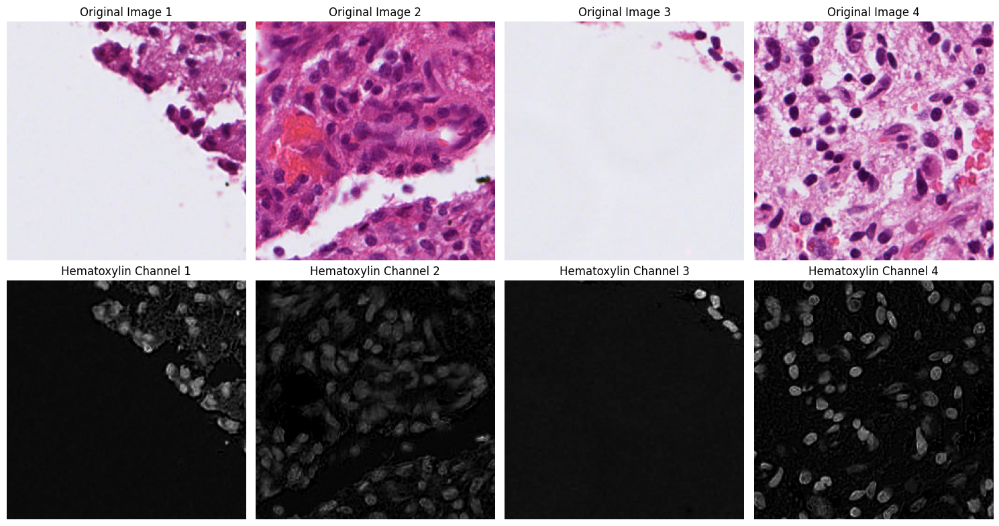

In [9]:
import numpy as np

def convert_to_hematoxylin_and_display(image_paths):
    fig, ax = plt.subplots(2, len(image_paths), figsize=(15, 8))

    for i, image_path in enumerate(image_paths):
        print(image_path)
        image = imread(image_path)

        if image.shape[-1] == 4:
            image = rgba2rgb(image)
        image_hed = rgb2hed(image)

        hematoxylin_channel = image_hed[:, :, 0]

        hematoxylin_normalized = (hematoxylin_channel - np.min(hematoxylin_channel)) / (
            np.max(hematoxylin_channel) - np.min(hematoxylin_channel)
        )

        ax[0, i].imshow(image)
        ax[0, i].axis('off')
        ax[0, i].set_title(f'Original Image {i+1}')

        ax[1, i].imshow(hematoxylin_normalized, cmap='gray')
        ax[1, i].axis('off')
        ax[1, i].set_title(f'Hematoxylin Channel {i+1}')

    plt.tight_layout()
    plt.show()

image_paths = [image_folder+'B1_0x82.png', image_folder+'B1_64x34.png', image_folder+'A1_0x38.png', image_folder+'A1_9x91.png']
convert_to_hematoxylin_and_display(image_paths)


#### iv. H-channel Analysis: 

##### Calculate the average intensity of the H-channel for each image. Create a scatter plot comparing these averages against the expression levels of NESTIN for each image. Assess the correlation between H-channel intensity and NESTIN expression. Discuss the potential of H-channel average as a predictive feature for NESTIN expression.

Pearson correlation: 0.5042521722654014


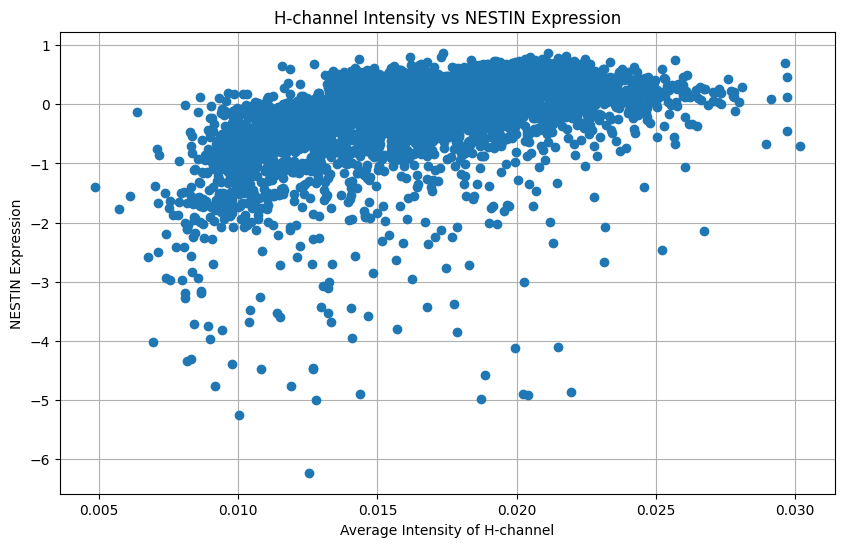

In [10]:
from scipy.stats import pearsonr
h_channel_average = []
nestin_expression = []

for idx in df.index:
    if df['specimen_id'][idx] == 'C1':
        continue

    image_path = image_folder + \
        df['specimen_id'][idx] + "_" + df['id'][idx] + ".png"

    try:
        I = rgba2rgb(imread(image_path))
        I_hed = rgb2hed(I)
        I_h = I_hed[:, :, 0]
    except:
        I = imread(image_path)
        I_hed = rgb2hed(I)
        I_h = I_hed[:, :, 0]

    else:
        h_channel_average.append(I_h.mean())
        nestin_expression.append(df['NESTIN'][idx])

corr, _ = pearsonr(h_channel_average, nestin_expression)
print(f"Pearson correlation: {corr}")

plt.figure(figsize=(10, 6))
plt.plot(h_channel_average, nestin_expression, "o")

plt.title('H-channel Intensity vs NESTIN Expression')
plt.xlabel('Average Intensity of H-channel')
plt.ylabel('NESTIN Expression')
plt.grid(True)
plt.show()

##### **Observations:**

- The Pearson correlation coefficient is 0.504, which indicates a moderate level of positive linear relationship between the H-channel intensity and NESTIN expression levels.
- The moderate correlation may not be reliable on its own for accurate predictions, as the average intensity of the H-channel will serve as one predictive feature for NESTIN expression.
- The wider spread of points with higher H-channel intensity, shows there is variance in NESTIN expression that is not being explained by H-channel intensity alone.

#### v. Performance Metrics for Prediction: Discuss suitable performance metrics for predicting protein expression from images. Identify the most appropriate metric for this specific problem and justify your choice.

1. **Root Mean Square Error (RMSE)**: It measures the average magnitude of the errors between predicted and actual values. RMSE is highly sensitive to outliers and large errors, making it useful when large errors are particularly undesirable.

2. **R-squared (R²) Score**: It indicates how well the intensity values or features derived from images explain the variance in protein expression levels.

3. **Pearson Correlation Coefficient**: It measures the linear relationship between predicted and actual values.

For predicting protein expression from images:

Considering these metrics, a combination of **RMSE**, **R2** and **Pearson Correlation Coefficient** will provide give a well-rounded evaluation.

### Question No. 2: (Feature Extraction and Classical Regression)

#### i) Extract features from an image, focusing on the following aspects:

##### 1. Calculate the average and variance for each of the 'H' (from HED), red, green, and blue channels.

In [11]:
def calculate_channel_stats(image_path):
    image = imread(image_path)
    if image.shape[-1] == 4:
        image = rgba2rgb(image)

    ihc_hed = rgb2hed(image)

    h_avg = np.mean(ihc_hed[:, :, 0])
    h_var = np.var(ihc_hed[:, :, 0])

    r_avg, g_avg, b_avg = np.mean(image, axis=(0, 1))
    r_var, g_var, b_var = np.var(image, axis=(0, 1))

    return (h_avg, h_var, r_avg, r_var, g_avg, g_var, b_avg, b_var)

channel_stats = {
    'Image': [],
    'H_avg': [],
    'H_var': [],
    'R_avg': [],
    'R_var': [],
    'G_avg': [],
    'G_var': [],
    'B_avg': [],
    'B_var': []
}

for file_name in glob.glob(os.path.join(os.getcwd(), 'content', 'patches_256', '*')):
    stats = calculate_channel_stats(file_name)
    channel_stats['Image'].append(file_name.split('/')[-1])
    channel_stats['H_avg'].append(stats[0])
    channel_stats['H_var'].append(stats[1])
    channel_stats['R_avg'].append(stats[2])
    channel_stats['R_var'].append(stats[3])
    channel_stats['G_avg'].append(stats[4])
    channel_stats['G_var'].append(stats[5])
    channel_stats['B_avg'].append(stats[6])
    channel_stats['B_var'].append(stats[7])

channel_stats_df = pd.DataFrame(channel_stats)
channel_stats_df

channel_stats_df.head()

,Image,H_avg,H_var,R_avg,R_var,G_avg,G_var,B_avg,B_var
0,D1_64x42.png,0.031333,0.000740,181.181625,1777.481462,120.624252,2441.004947,181.553268,1139.787781
1,A1_76x90.png,0.017839,0.000351,0.772810,0.018275,0.476504,0.035370,0.703487,0.015669
2,A1_59x73.png,0.009373,0.000176,0.810137,0.010062,0.433641,0.013388,0.676688,0.006848
3,D1_7x67.png,0.026770,0.000975,193.694519,2220.797886,149.382187,3696.519995,193.126312,1710.751806
4,A1_71x101.png,0.016701,0.000392,0.783641,0.017767,0.493482,0.033611,0.711760,0.015155


In [12]:
channel_stats_df[channel_stats_df['Image'] == 'D1_64x42.png']

,Image,H_avg,H_var,R_avg,R_var,G_avg,G_var,B_avg,B_var
0,D1_64x42.png,0.031333,0.00074,181.181625,1777.481462,120.624252,2441.004947,181.553268,1139.787781


##### 2. Additionally, consider other potentially useful features for this task and justify their inclusion.

##### Feature Evaluation:
- After feature extraction, plot scatter plots and calculate the correlation coefficient for each feature (from steps a-c) versus the target variable. This analysis will help identify which features are most predictive of the target.
- Important Features: Discuss the importance of selected features based on their
correlation with the target variable and their contribution to model performance

In [13]:
from PIL import Image
import os
from torchvision.io import read_image
from torch.utils.data import Dataset
from skimage import io, color, feature, exposure
from sklearn import preprocessing
from torchvision import transforms
from torch.utils.data import DataLoader
import torch

In [14]:
df_train = df[df['specimen_id'].isin(['A1', 'B1', 'D1'])]
df_test = df[df['specimen_id'] == 'C1']

print(f'Train: {len(df_train)} examples')
print(f'Test: {len(df_test)} examples')

Train: 5792 examples
Test: 4129 examples


In [15]:
len(df_train[df_train['specimen_id'] == 'A1'])

2894

In [16]:
df_train['specimen_id'].unique()

array(['A1', 'B1', 'D1'], dtype=object)

In [17]:
df_test['specimen_id'].unique()

array(['C1'], dtype=object)

In [18]:
transform_pipeline = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

In [19]:
class ConvertToRGB:
    def __call__(self, image):
        return image.convert("RGB")

transform_pipeline = transforms.Compose([
    transforms.ToPILImage(),
    ConvertToRGB(),
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

In [20]:
def extract_features_and_labels(img_dir, df, transform):
    features = []
    labels = []

    for idx in df.index:
        img_name = df['specimen_id'][idx] + "_" + df['id'][idx] + ".png"
        img_path = os.path.join(img_dir, img_name)

        if os.path.exists(img_path):
            image = read_image(img_path)
            image = transform(image)

            image = image.view(-1).numpy()

            features.append(image)
            labels.append(df.loc[idx]['NESTIN'])
        else:
            print(f"Image {img_path} not found.")
    return np.array(features), np.array(labels)

In [21]:
X, y = extract_features_and_labels(image_folder, df, transform_pipeline)

print(f"Features shape: {X.shape}")
print(f"Labels shape: {y.shape}")

Features shape: (9921, 150528)
Labels shape: (9921,)


In [22]:
X_train, y_train = extract_features_and_labels(image_folder, df_train, transform_pipeline)
print(f"Features shape: {X_train.shape}")
print(f"Labels shape: {y_train.shape}")

Features shape: (5792, 150528)
Labels shape: (5792,)


In [23]:
X_test, y_test = extract_features_and_labels(image_folder, df_test, transform_pipeline)
print(f"Features shape: {X_test.shape}")
print(f"Labels shape: {y_test.shape}")

Features shape: (4129, 150528)
Labels shape: (4129,)


1. **PCA (Principal Component Analysis)**:

In [24]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_train)

In [25]:
from sklearn.decomposition import PCA

n_components = 0.95
pca = PCA(n_components=n_components)

X_pca = pca.fit_transform(X_scaled)

In [26]:
pca.fit(X_scaled)
pca_transform_X = pca.transform(X_scaled)

In [27]:
print(pca_transform_X.shape)
print(y.shape)

(5792, 3231)
(9921,)


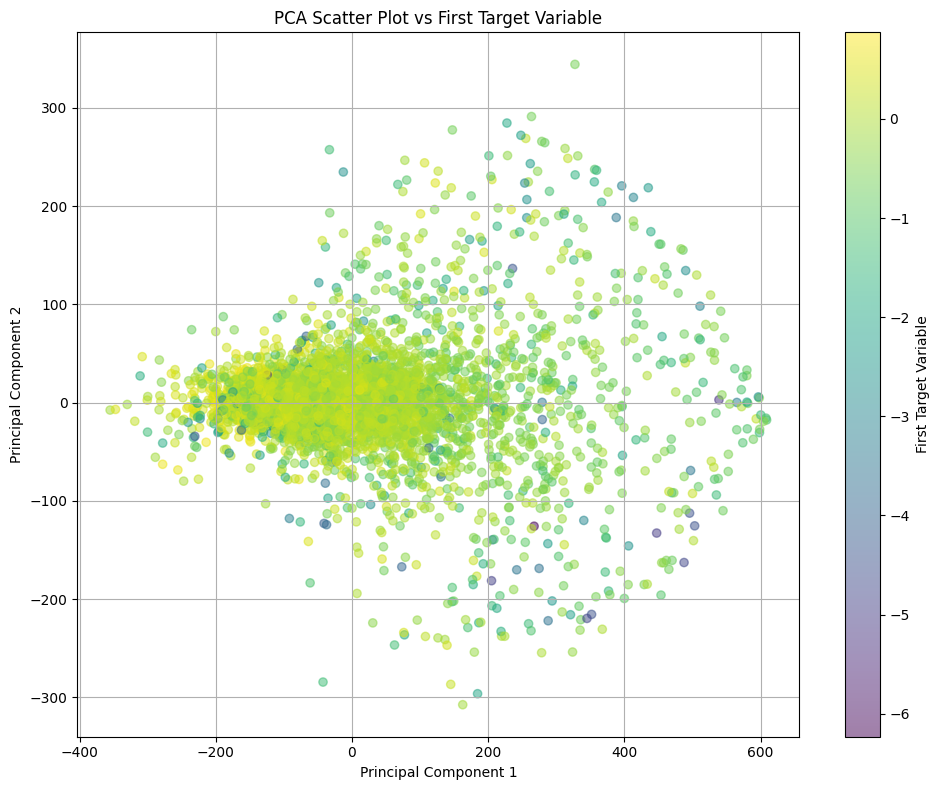

In [28]:
plt.figure(figsize=(10, 8))
plt.scatter(pca_transform_X[:, 0], pca_transform_X[:, 1], c=y_train, marker='o', alpha=0.5, cmap='viridis')
plt.title('PCA Scatter Plot vs First Target Variable')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.colorbar(label='First Target Variable')
plt.grid(True)
plt.tight_layout()
plt.show()


In [29]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import pearsonr

In [30]:
from scipy.stats import pearsonr

In [31]:
corr_coefficients_pca = [pearsonr(pca_transform_X[:, i], y_train)[0] for i in range(pca_transform_X.shape[1])]

coefficients_pca = []
for coeff in corr_coefficients_pca:
    if abs(coeff) > 0.25:
        coefficients_pca.append(coeff)

print(f"Coefficient with high correlation : {coefficients_pca}")
print(f"Pearson Correlation Coefficient : {sum(coefficients_pca) / len(coefficients_pca)}")

Coefficient with high correlation : [-0.298692006453844, -0.4436066482894488]
Pearson Correlation Coefficient : -0.3711493273716464


2. **GLCM (Gray Level Co-occurrence Matrix)**:

In [32]:
from skimage.feature import graycomatrix, graycoprops
from skimage.color import rgb2gray

In [33]:
def calculate_glcm_features(image):
    image_uint8 = (image * 255).astype(np.uint8)
    grayscale = rgb2gray(image_uint8)
    grayscale_uint8 = (grayscale * 255).astype(np.uint8)

    glcm = graycomatrix(grayscale_uint8, distances=[1], angles=[0], levels=256, symmetric=True, normed=True)
    features = np.hstack([graycoprops(glcm, prop).ravel() for prop in ['contrast', 'dissimilarity', 'homogeneity', 'energy', 'correlation', 'ASM']])
    return features

X_train_glcm = np.array([calculate_glcm_features(image.reshape(224, 224, 3)) for image in X_train])

In [34]:
X_test_glcm = np.array([calculate_glcm_features(image.reshape(224, 224, 3)) for image in X_test])

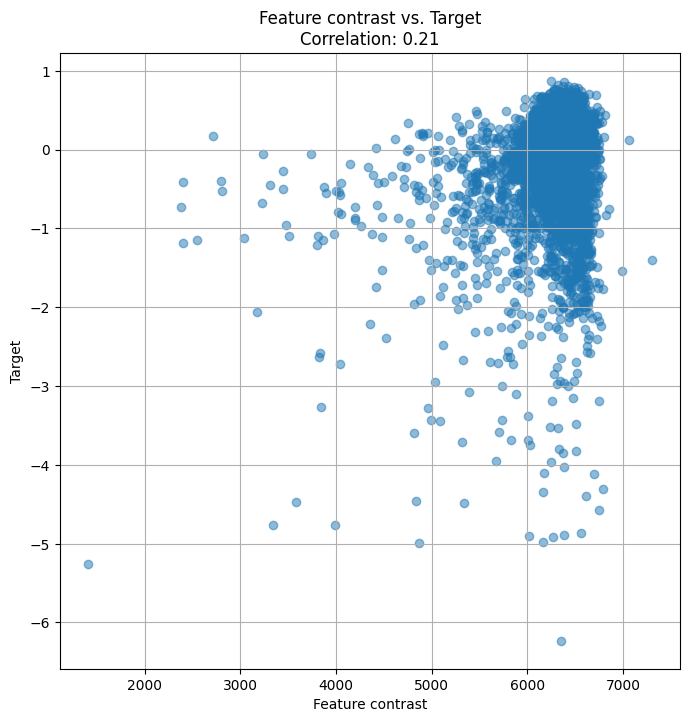

Feature contrast correlation with the target: 0.2075


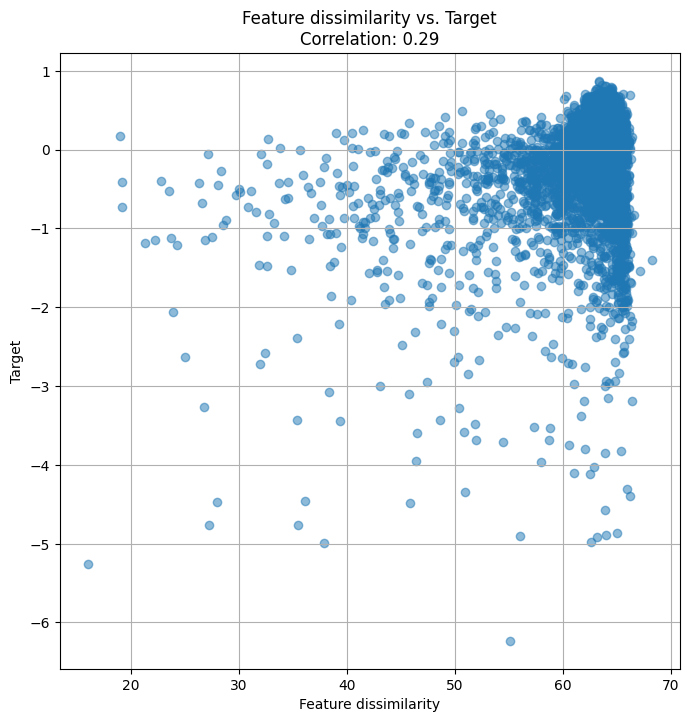

Feature dissimilarity correlation with the target: 0.2920


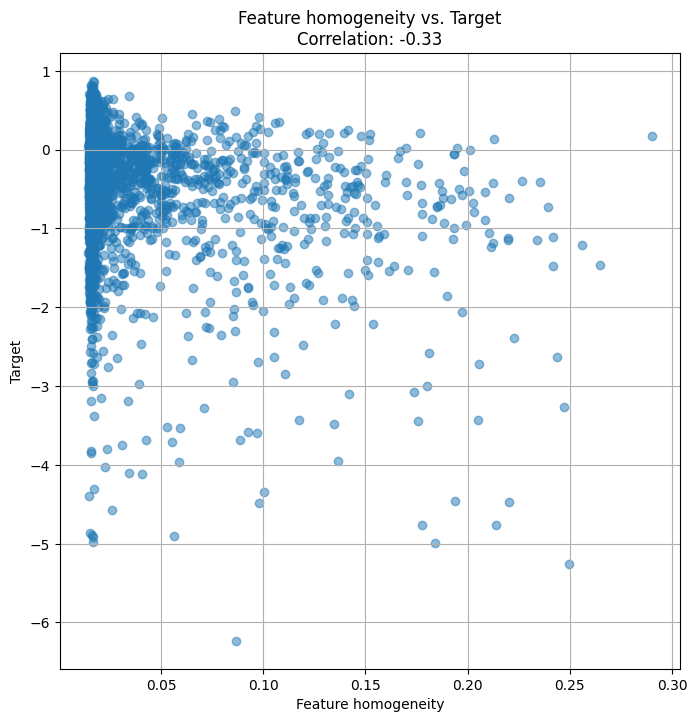

Feature homogeneity correlation with the target: -0.3309


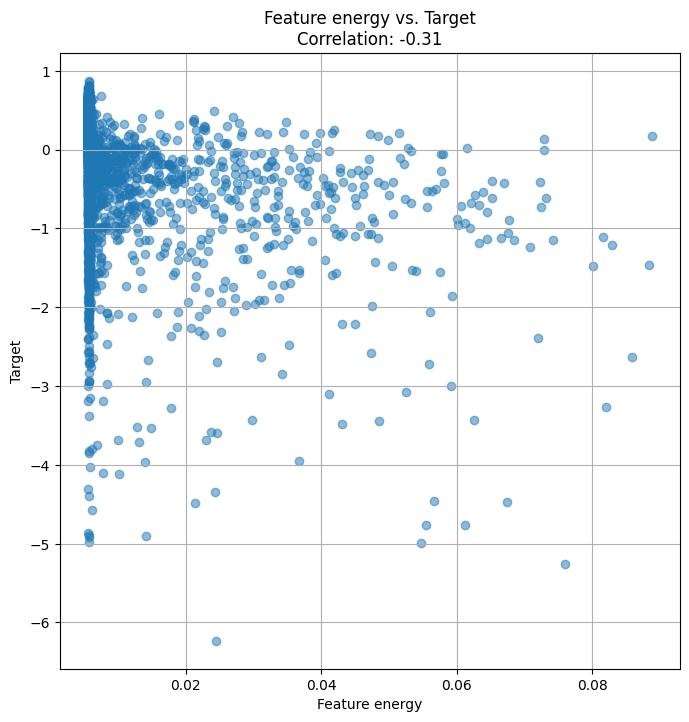

Feature energy correlation with the target: -0.3064


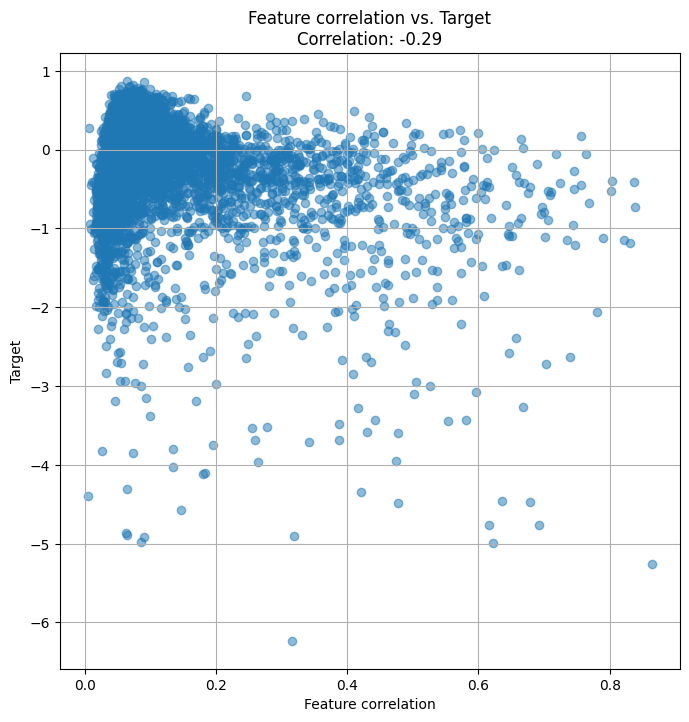

Feature correlation correlation with the target: -0.2950


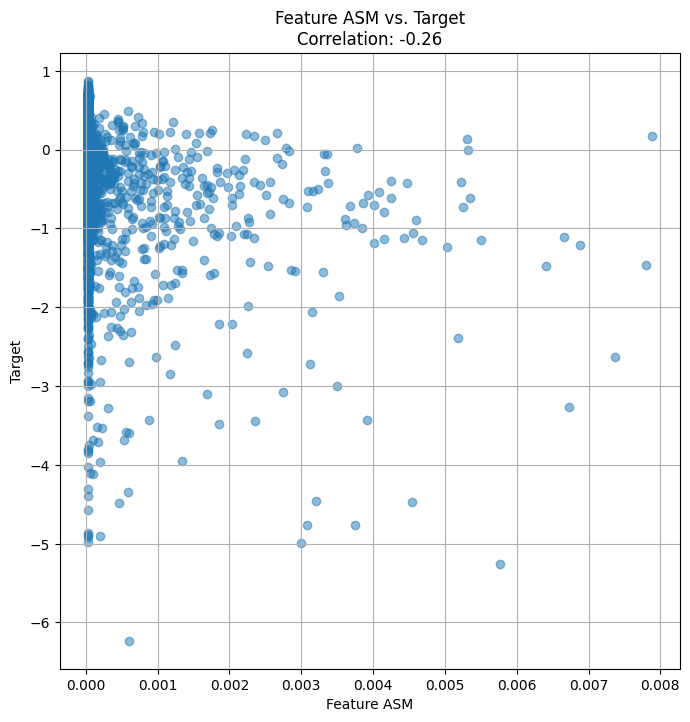

Feature ASM correlation with the target: -0.2607


In [35]:
num_features = X_train_glcm.shape[1]
glcm_features = ['contrast', 'dissimilarity', 'homogeneity', 'energy', 'correlation', 'ASM']

for i in range(num_features):
    feature = X_train_glcm[:, i]
    target = y_train

    corr, _ = pearsonr(feature, target)
    
    plt.figure(figsize=(8, 8))
    plt.scatter(feature, target, alpha=0.5)
    plt.title(f'Feature {glcm_features[i]} vs. Target\nCorrelation: {corr:.2f}')
    plt.xlabel(f'Feature {glcm_features[i]}')
    plt.ylabel('Target')
    plt.grid(True)
    plt.show()

    print(f'Feature {glcm_features[i]} correlation with the target: {corr:.4f}')


#### 3. Transfer Learning Features

In [36]:
import torch
from torchvision import models, transforms
from torchvision.io import read_image
from torch.utils.data import DataLoader, Dataset

In [37]:
resnet50 = models.resnet50(pretrained=True)

resnet50 = torch.nn.Sequential(*(list(resnet50.children())[:-1]))
resnet50.eval()

/Users/adityamahamuni/anaconda3/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/Users/adityamahamuni/anaconda3/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Sequential(
  (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (2): ReLU(inplace=True)
  (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (4): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)


In [38]:
class ProteinImageDataset(Dataset):
    def __init__(self, df, img_dir, transform=None, feature_extractor=None):
        self.df = df
        self.img_dir = img_dir
        self.transform = transform
        self.feature_extractor = feature_extractor

    def __len__(self):
        return len(self.df)
    
    def __getitem__(self, idx):
        img_name = f"{self.df.iloc[idx]['specimen_id']}_{self.df.iloc[idx]['id']}.png"
        img_path = os.path.join(self.img_dir, img_name)
        
        if not os.path.exists(img_path):
            print(f"Image {img_path} not found.")
            return None, None
        
        image = read_image(img_path)
        
        if self.transform:
            image = self.transform(image)
        
        if self.feature_extractor:
            with torch.no_grad():
                image = image.unsqueeze(0)
                features = self.feature_extractor(image)
                features = features.view(features.size(0), -1)
            return features.squeeze(0), self.df.iloc[idx]['NESTIN']
        
        return image, self.df.iloc[idx]['NESTIN']


In [39]:
train_image_dataset = ProteinImageDataset(df_train, image_folder, transform=transform_pipeline, feature_extractor=resnet50)
train_image_dataloader = DataLoader(train_image_dataset, batch_size=32, shuffle=True)

In [40]:
features = []
labels = []

with torch.no_grad():
    for images, batch_labels in train_image_dataloader:
        features.append(images)
        labels.append(batch_labels)

train_features = torch.cat(features, dim=0)
train_labels = torch.cat(labels, dim=0)

print(f"Features shape: {train_features.shape}")
print(f"Labels shape: {train_labels.shape}")

Features shape: torch.Size([5792, 2048])
Labels shape: torch.Size([5792])


In [41]:
if isinstance(train_features, torch.Tensor):
    train_features = train_features.numpy()
if isinstance(train_labels, torch.Tensor):
    train_labels = train_labels.numpy()

In [42]:
test_image_dataset = ProteinImageDataset(df_test, image_folder, transform=transform_pipeline, feature_extractor=resnet50)
test_image_dataloader = DataLoader(test_image_dataset, batch_size=32, shuffle=True)

In [43]:
features = []
labels = []

with torch.no_grad():
    for images, batch_labels in test_image_dataloader:
        features.append(images)
        labels.append(batch_labels)

test_features = torch.cat(features, dim=0)
test_labels = torch.cat(labels, dim=0)

print(f"Test Features shape: {test_features.shape}")
print(f"Test Labels shape: {test_labels.shape}")

Test Features shape: torch.Size([4129, 2048])
Test Labels shape: torch.Size([4129])


In [44]:
if isinstance(test_features, torch.Tensor):
    test_features = test_features.numpy()
if isinstance(test_labels, torch.Tensor):
    test_labels = test_labels.numpy()

Pearson Correlation Coefficients TL: [0.48922549899586043, -0.41108635385447034, 0.4059663678618991, -0.406118998258067, 0.4911752869131139, -0.4092334406519995, 0.4145727471458773, -0.4008648808139723, -0.4102277403194526, 0.4125593229286787, -0.4073957947794212, -0.4339199733142991, -0.43324495859879464, -0.44840088814737766, -0.4135685367399223, 0.40854972006155915, 0.40873877901283684, -0.43348656888520243, -0.4236431342530117, 0.4170348834190284, 0.4842155409691703, 0.4150705883680219, -0.4125243048716725]
Number of Coefficients with coefficient > than 0.4 : 23


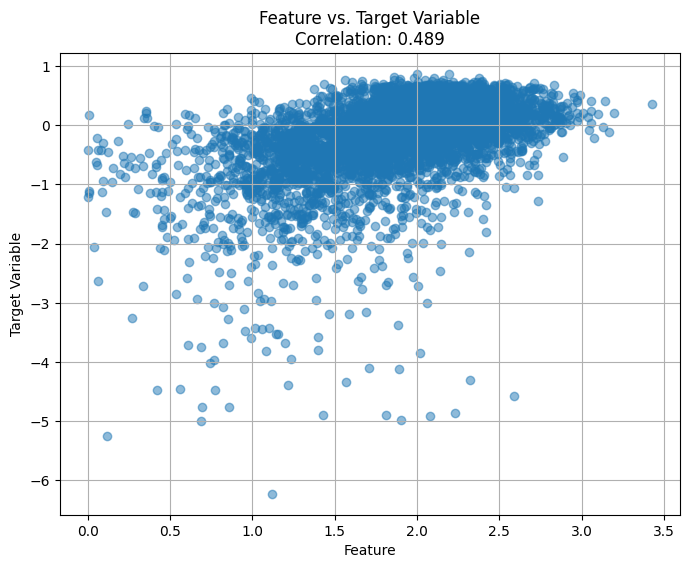

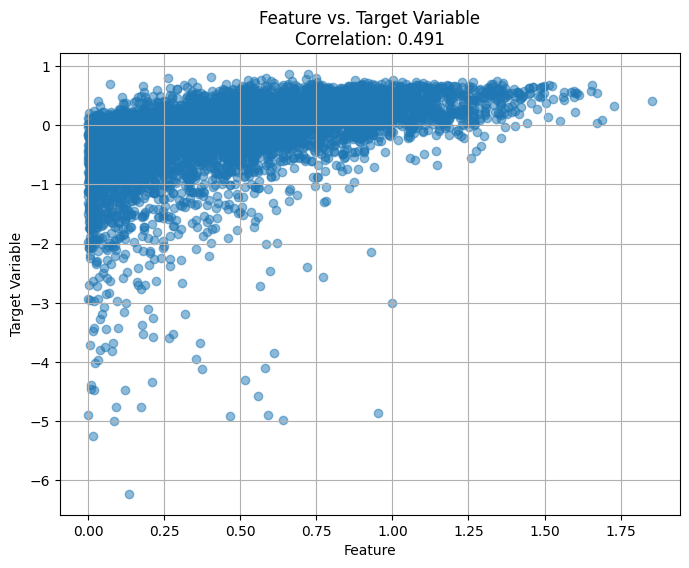

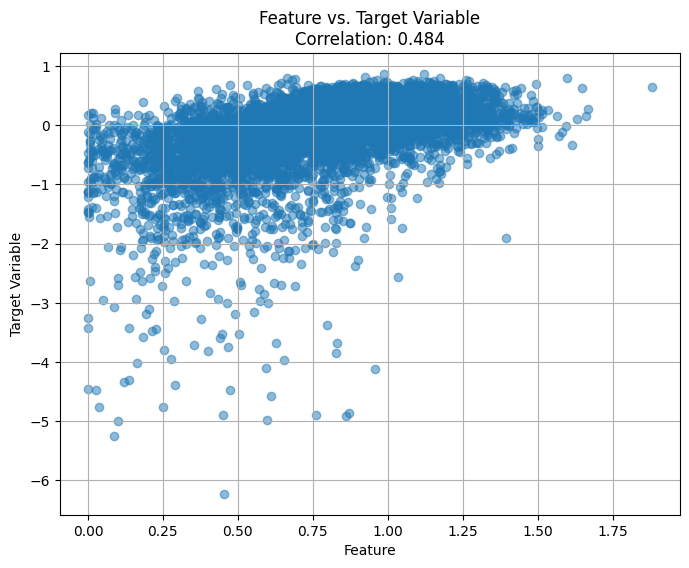

In [45]:
selected_feature = train_features
target_variable = train_labels

tl_coefficients = []
for i in range(selected_feature.shape[1]):
    feature = selected_feature[:, i]
    corr_coefficient_tl, _ = pearsonr(feature, target_variable)
    
    if abs(corr_coefficient_tl) > 0.4:
        tl_coefficients.append(corr_coefficient_tl)


if tl_coefficients:
    print(f"Pearson Correlation Coefficients TL: {tl_coefficients}")
else:
    print("No coefficients with absolute value greater than 0.4")

print(f"Number of Coefficients with coefficient > than 0.4 : {len(tl_coefficients)}")

for i in range(selected_feature.shape[1]):
    feature = selected_feature[:, i]
    corr_coefficient_tl, _ = pearsonr(feature, target_variable)

    if abs(corr_coefficient_tl) > 0.45:

        plt.figure(figsize=(8, 6))
        plt.scatter(feature, target_variable, alpha=0.5)
        plt.title(
            'Feature vs. Target Variable\n' f'Correlation: {corr_coefficient_tl:.3f}')
        plt.xlabel('Feature')
        plt.ylabel('Target Variable')
        plt.grid(True)

plt.show()

#### Q2 ii) Apply the following regression models using the features from Q2(i):
- Ordinary Least Squares (OLS) Regression or Multi-layer Perceptron (MLP) (your
choice!)
- Support Vector Regression (SVR)

For each model, create scatter plots to compare the true and predicted values on the test data. Additionally, evaluate and report your models' performance using the following metrics: RMSE, Pearson Correlation Coefficient, Spearman Correlation Coefficient, and R2 score. 

**Deliverables**:
Scatter plots for true vs. predicted values for each model type.
Performance metrics (RMSE, Pearson, Spearman, R2 score) on the test data.

#### 1. Ordinary Least Squares (OLS) Regression or Multi-layer Perceptron (MLP)

In [46]:
from sklearn.neural_network import MLPRegressor
from sklearn.linear_model import LinearRegression

from sklearn.metrics import mean_squared_error, r2_score
from scipy.stats import spearmanr

In [47]:
def evaluate_regression_model(y_true, y_pred=None, model_name="Model", results_df=None):
    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    r2 = r2_score(y_true, y_pred)
    pearson_corr, _ = pearsonr(y_true, y_pred)
    spearman_corr, _ = spearmanr(y_true, y_pred)
    
    print(f"{model_name} Evaluation:")
    print(f"RMSE: {rmse:.4f}")
    print(f"R2 Score: {r2}")
    print(f"Pearson Correlation Coefficient: {pearson_corr:.4f}")
    print(f"Spearman Correlation Coefficient: {spearman_corr:.4f}\n")

    new_row = pd.DataFrame({
        'Model Name': [model_name],
        'RMSE' : [rmse],
        'R2 Score' : [r2],
        'Pearson Correlation' : [pearson_corr],
        'Spearman Correlation' : [spearman_corr]
    })

    if results_df is None:
        results_df = pd.DataFrame(columns=['Model Name', 'RMSE', 'R2 Score', 'Pearson Correlation', 'Spearman Correlation'])

    results_df = pd.concat([results_df, new_row], ignore_index=True)

    return results_df

In [48]:
regression_metrics_df = None

In [49]:
def plot_regression_model(y_true, y_pred, title):
    plt.figure(figsize=(10, 8))
    plt.scatter(y_true, y_pred, alpha=0.5)

    slope, intercept = np.polyfit(y_true, y_pred, 1)
    line = np.poly1d((slope, intercept))
    plt.plot(y_true, line(y_true), color='red', label='Regression Line')

    plt.title(title)
    plt.xlabel('True Values')
    plt.ylabel('Predicted Values')
    plt.grid(True)
    plt.show()

In [50]:
X_test = X_test.reshape(len(X_test), -1)
X_test_scaled = scaler.transform(X_test)
X_test_pca = pca.transform(X_test)

##### 1.1.1 OLS Regression with PCA

In [51]:
ols_pca = LinearRegression()
ols_pca.fit(X_pca, y_train)

pred_ols_pca = ols_pca.predict(X_test_pca)

ols_train_score_pca = ols_pca.score(X_pca, y_train)
ols_test_score_pca = ols_pca.score(X_test_pca, y_test)

print(f"OLS Training Score (PCA): {ols_train_score_pca}")
print(f"OLS Test Score (PCA): {ols_test_score_pca}")

OLS Training Score (PCA): 0.6951632970549113
OLS Test Score (PCA): -0.24779276156867547


In [52]:
regression_metrics_df = evaluate_regression_model(y_test, pred_ols_pca, "OLS-PCA", regression_metrics_df)

OLS-PCA Evaluation:
RMSE: 0.7393
R2 Score: -0.24779276156867547
Pearson Correlation Coefficient: 0.4740
Spearman Correlation Coefficient: 0.5101



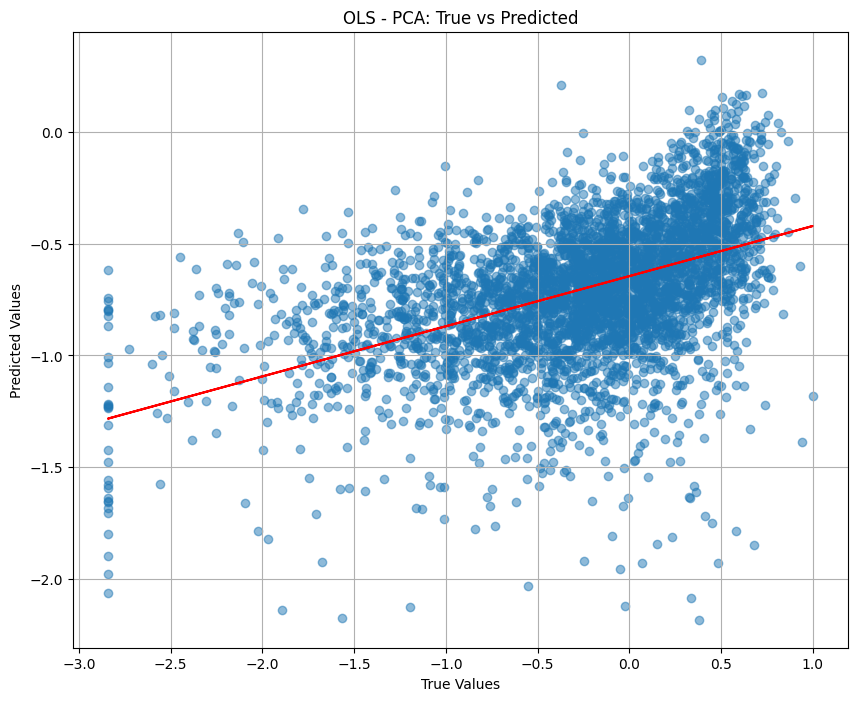

In [53]:
plot_regression_model(y_test, pred_ols_pca, 'OLS - PCA: True vs Predicted')

In [54]:
regression_metrics_df

,Model Name,RMSE,R2 Score,Pearson Correlation,Spearman Correlation
0,OLS-PCA,0.739311,-0.247793,0.474041,0.510122


##### 1.1.2 OLS Regression with GLCM

In [55]:
ols_glcm = LinearRegression()
ols_glcm.fit(X_train_glcm, y_train)

pred_ols_glcm = ols_glcm.predict(X_test_glcm)

ols_train_score_glcm = ols_glcm.score(X_train_glcm, y_train)
ols_test_score_glcm = ols_glcm.score(X_test_glcm, y_test)

print(f"OLS Training Score (GLCM): {ols_train_score_glcm}")
print(f"OLS Test Score (GLCM): {ols_test_score_glcm}")

OLS Training Score (GLCM): 0.15837124337912745
OLS Test Score (GLCM): 0.008610104249079042


In [56]:
regression_metrics_df = evaluate_regression_model(y_test, pred_ols_glcm, "OLS-GLCM", regression_metrics_df)

OLS-GLCM Evaluation:
RMSE: 0.6590
R2 Score: 0.008610104249079042
Pearson Correlation Coefficient: 0.2058
Spearman Correlation Coefficient: 0.2704



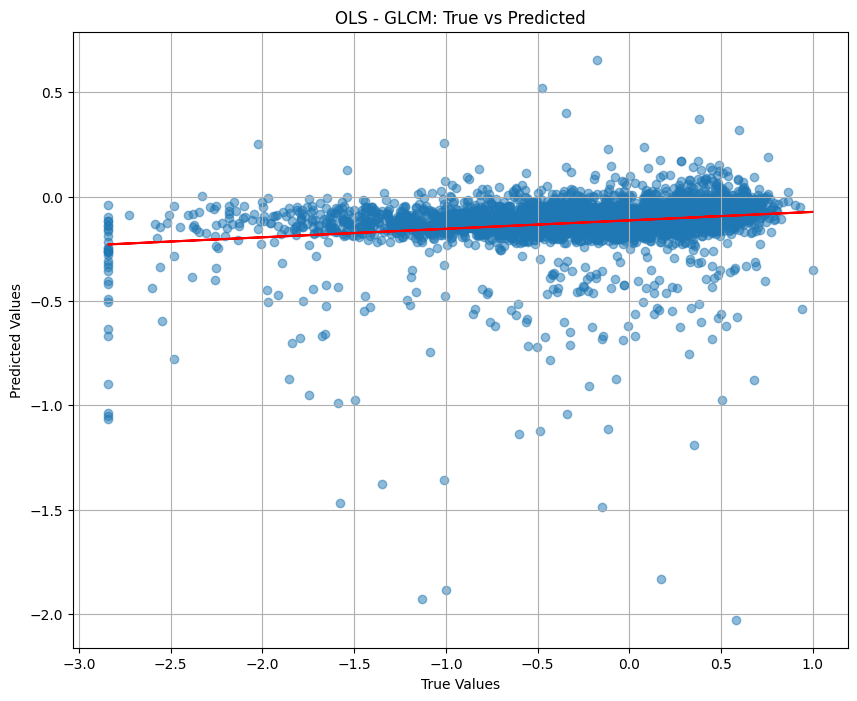

In [57]:
plot_regression_model(y_test, pred_ols_glcm, 'OLS - GLCM: True vs Predicted')

In [59]:
regression_metrics_df

,Model Name,RMSE,R2 Score,Pearson Correlation,Spearman Correlation
0,OLS-PCA,0.739311,-0.247793,0.474041,0.510122
1,OLS-GLCM,0.658989,0.008610,0.205798,0.270421


1.1.3 OLS with Transfer Learning

In [60]:
train_features_scaled_ols = scaler.fit_transform(train_features)
test_features_scaled_ols = scaler.transform(test_features)

In [61]:
ols_tl = LinearRegression()
ols_tl.fit(train_features_scaled_ols, train_labels)

pred_ols_tl = ols_tl.predict(test_features_scaled_ols)

ols_train_score_tl = ols_tl.score(train_features_scaled_ols, train_labels)
ols_test_score_tl = ols_tl.score(test_features_scaled_ols, test_labels)

print(f"OLS Training Score (TL): {ols_train_score_tl}")
print(f"OLS Test Score (TL): {ols_test_score_tl}")

OLS Training Score (TL): 0.729795535422151
OLS Test Score (TL): -0.35163205031251765


In [62]:
regression_metrics_df = evaluate_regression_model(y_test, pred_ols_tl, "OLS-TL", regression_metrics_df)

OLS-TL Evaluation:
RMSE: 0.9455
R2 Score: -1.0410004747966335
Pearson Correlation Coefficient: 0.0063
Spearman Correlation Coefficient: 0.0094



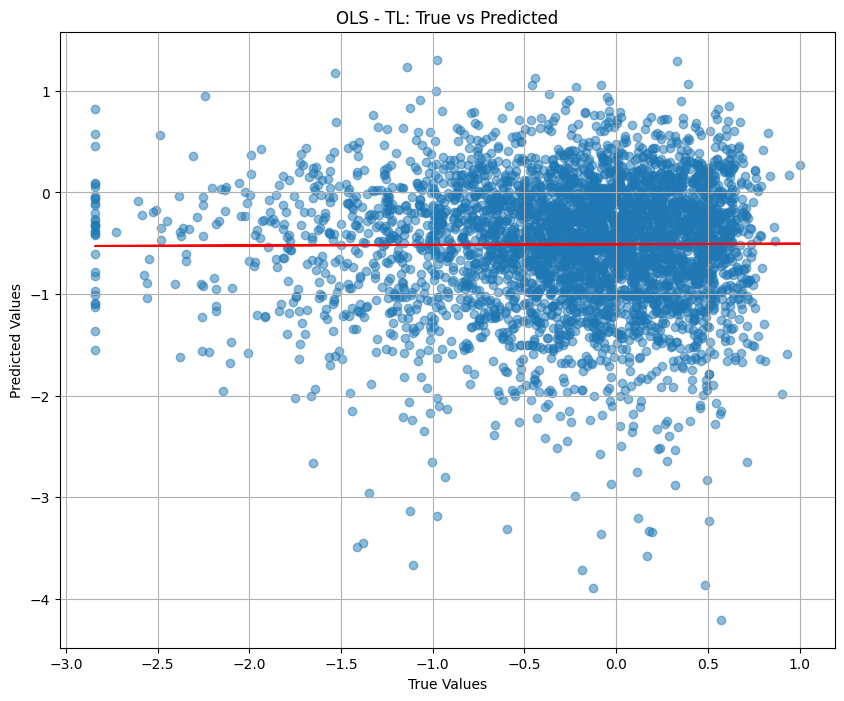

In [63]:
plot_regression_model(y_test, pred_ols_tl, 'OLS - TL: True vs Predicted')

In [64]:
regression_metrics_df

,Model Name,RMSE,R2 Score,Pearson Correlation,Spearman Correlation
0,OLS-PCA,0.739311,-0.247793,0.474041,0.510122
1,OLS-GLCM,0.658989,0.008610,0.205798,0.270421
2,OLS-TL,0.945535,-1.041000,0.006344,0.009417


##### 1.2.1 MLP Regression with PCA

In [65]:
mlp_regressor_pca = MLPRegressor(hidden_layer_sizes=(100,), max_iter=1000, random_state=42)
mlp_regressor_pca.fit(X_pca, y_train)

preds_mlp_pca = mlp_regressor_pca.predict(X_test_pca)

mlp_train_score_pca = mlp_regressor_pca.score(X_pca, y_train)
mlp_test_score_pca = mlp_regressor_pca.score(X_test_pca, y_test)

print(f"MLP Training Score (PCA) : {mlp_train_score_pca}")
print(f"MLP Test Score (PCA) : {mlp_test_score_pca}")

MLP Training Score (PCA) : -1.3499886269898504
MLP Test Score (PCA) : -10.343043435153145


In [66]:
regression_metrics_df = evaluate_regression_model(y_test, preds_mlp_pca, "MLP-PCA", regression_metrics_df)

MLP-PCA Evaluation:
RMSE: 2.2291
R2 Score: -10.343043435153145
Pearson Correlation Coefficient: 0.2452
Spearman Correlation Coefficient: 0.2574



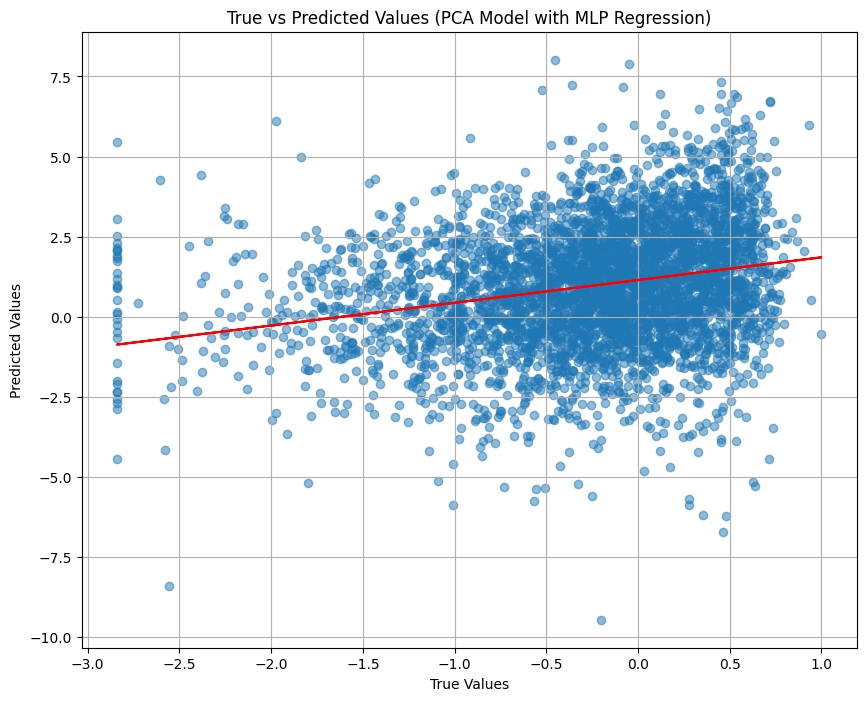

In [67]:
plot_regression_model(y_test, preds_mlp_pca, "True vs Predicted Values (PCA Model with MLP Regression)")

In [68]:
regression_metrics_df

,Model Name,RMSE,R2 Score,Pearson Correlation,Spearman Correlation
0,OLS-PCA,0.739311,-0.247793,0.474041,0.510122
1,OLS-GLCM,0.658989,0.008610,0.205798,0.270421
2,OLS-TL,0.945535,-1.041000,0.006344,0.009417
3,MLP-PCA,2.229056,-10.343043,0.245175,0.257448


##### 1.2.2 MLP Regression with GLCM

In [69]:
X_glcm_scaled = scaler.fit_transform(X_train_glcm)
X_test_glcm_scaled = scaler.transform(X_test_glcm)

In [70]:
mlp_model_glcm = MLPRegressor(random_state=1, max_iter=500)
mlp_model_glcm.fit(X_glcm_scaled, y_train)

preds_mlp_glcm = mlp_model_glcm.predict(X_test_glcm_scaled)

mlp_train_score_glcm = mlp_model_glcm.score(X_glcm_scaled, y_train)
mlp_test_score_glcm = mlp_model_glcm.score(X_test_glcm_scaled, y_test)

print(f"MLP Training Score (GLCM): {mlp_train_score_glcm}")
print(f"MLP Test Score (GLCM): {mlp_test_score_glcm}")

MLP Training Score (GLCM): 0.27533364698732044
MLP Test Score (GLCM): 0.16787283760482619


In [71]:
regression_metrics_df = evaluate_regression_model(y_test, preds_mlp_glcm, "MLP-GLCM", regression_metrics_df)

MLP-GLCM Evaluation:
RMSE: 0.6037
R2 Score: 0.16787283760482619
Pearson Correlation Coefficient: 0.4391
Spearman Correlation Coefficient: 0.5159



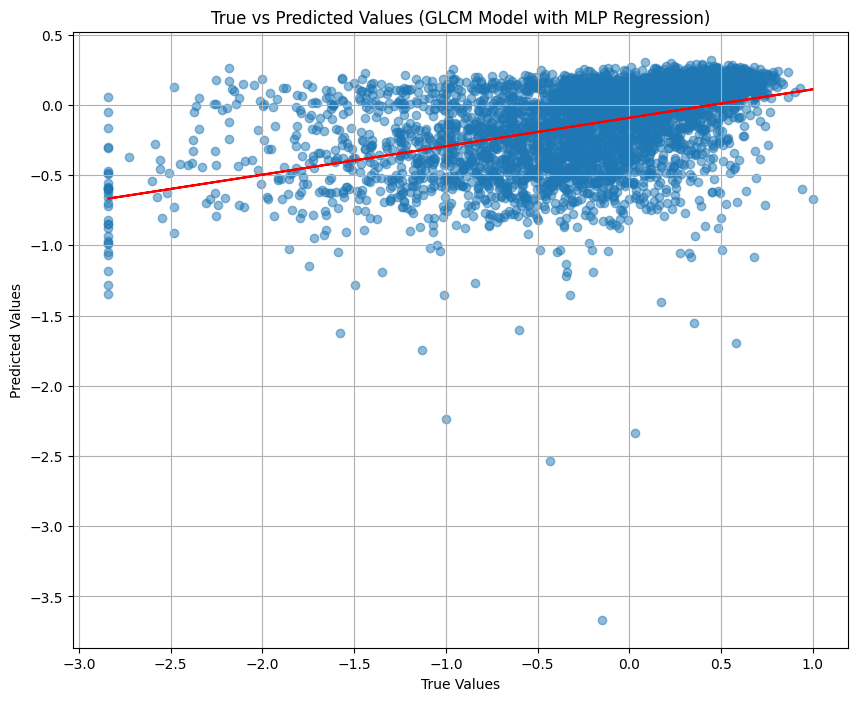

In [72]:
plot_regression_model(y_test, preds_mlp_glcm, "True vs Predicted Values (GLCM Model with MLP Regression)")

In [73]:
regression_metrics_df

,Model Name,RMSE,R2 Score,Pearson Correlation,Spearman Correlation
0,OLS-PCA,0.739311,-0.247793,0.474041,0.510122
1,OLS-GLCM,0.658989,0.008610,0.205798,0.270421
2,OLS-TL,0.945535,-1.041000,0.006344,0.009417
3,MLP-PCA,2.229056,-10.343043,0.245175,0.257448
4,MLP-GLCM,0.603741,0.167873,0.439092,0.515921


##### 1.2.3 MLP Regression with Transfer Learning

In [74]:
train_features_scaled = scaler.fit_transform(train_features)
test_features_scaled = scaler.transform(test_features)

In [75]:
mlp_regressor_tl = MLPRegressor(random_state=1, max_iter=500)
mlp_regressor_tl.fit(train_features_scaled, train_labels)

mlp_score_train_tl = mlp_regressor_tl.score(train_features_scaled, train_labels)
mlp_score_test_tl = mlp_regressor_tl.score(test_features_scaled, test_labels)

print(f"MLP Regressor Training Score: {mlp_score_train_tl}")
print(f"MLP Regressor Test Score: {mlp_score_test_tl}")

MLP Regressor Training Score: 0.9646359743806224
MLP Regressor Test Score: -0.3099881057366596


In [76]:
y_pred_tl = mlp_regressor_tl.predict(test_features)

regression_metrics_df = evaluate_regression_model(y_test, y_pred_tl, "MLP-TL", regression_metrics_df)

MLP-TL Evaluation:
RMSE: 0.8158
R2 Score: -0.5195046975997821
Pearson Correlation Coefficient: 0.0002
Spearman Correlation Coefficient: -0.0081



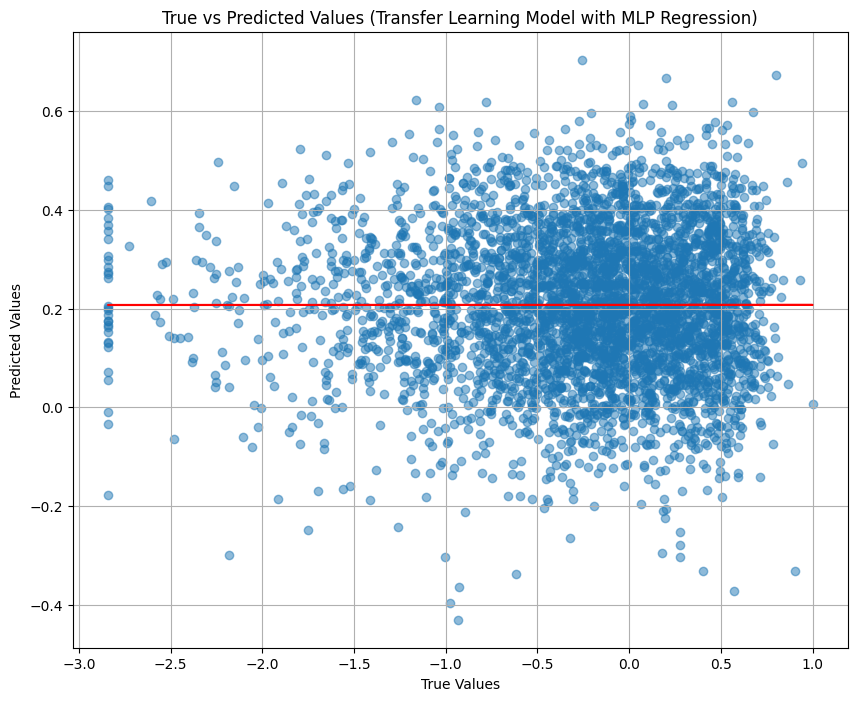

In [77]:
plot_regression_model(y_test, y_pred_tl, "True vs Predicted Values (Transfer Learning Model with MLP Regression)")

In [78]:
regression_metrics_df

,Model Name,RMSE,R2 Score,Pearson Correlation,Spearman Correlation
0,OLS-PCA,0.739311,-0.247793,0.474041,0.510122
1,OLS-GLCM,0.658989,0.008610,0.205798,0.270421
2,OLS-TL,0.945535,-1.041000,0.006344,0.009417
3,MLP-PCA,2.229056,-10.343043,0.245175,0.257448
4,MLP-GLCM,0.603741,0.167873,0.439092,0.515921
5,MLP-TL,0.815844,-0.519505,0.000204,-0.008077


#### 2. Support Vector Regression (SVR)

##### 2.1.1 SVR with PCA

In [79]:
from sklearn.svm import SVR

from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler

In [80]:
svr_pca = SVR(kernel='rbf')
svr_pca.fit(X_pca, y_train)

preds_svr_pca = svr_pca.predict(X_test_pca)

svr_train_score_pca = svr_pca.score(X_pca, y_train)
svr_test_score_pca = svr_pca.score(X_test_pca, y_test)

print(f"SVR Training Score (PCA) : {svr_train_score_pca}")
print(f"SVR Test Score (PCA) : {svr_test_score_pca}")

SVR Training Score (PCA) : 0.7825782539033495
SVR Test Score (PCA) : -3.7312346559090557


In [81]:
regression_metrics_df = evaluate_regression_model(y_test, preds_svr_pca, "SVR-PCA", regression_metrics_df)

SVR-PCA Evaluation:
RMSE: 1.4396
R2 Score: -3.7312346559090557
Pearson Correlation Coefficient: 0.0053
Spearman Correlation Coefficient: 0.0293



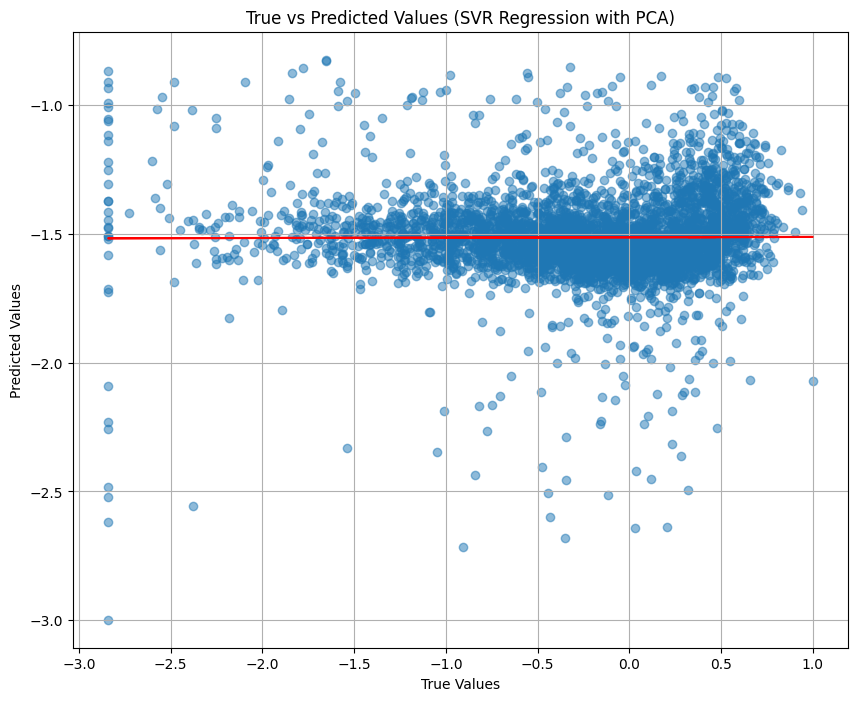

In [82]:
plot_regression_model(y_test, preds_svr_pca, "True vs Predicted Values (SVR Regression with PCA)")

In [83]:
regression_metrics_df

,Model Name,RMSE,R2 Score,Pearson Correlation,Spearman Correlation
0,OLS-PCA,0.739311,-0.247793,0.474041,0.510122
1,OLS-GLCM,0.658989,0.008610,0.205798,0.270421
2,OLS-TL,0.945535,-1.041000,0.006344,0.009417
3,MLP-PCA,2.229056,-10.343043,0.245175,0.257448
4,MLP-GLCM,0.603741,0.167873,0.439092,0.515921
5,MLP-TL,0.815844,-0.519505,0.000204,-0.008077
6,SVR-PCA,1.439605,-3.731235,0.005259,0.029335


##### 2.1.2 SVR with GLCM

In [84]:
X_glcm_scaled = scaler.fit_transform(X_train_glcm)
X_test_glcm_scaled = scaler.transform(X_test_glcm)

In [85]:
svr_glcm = SVR(kernel='rbf')
svr_glcm.fit(X_glcm_scaled, y_train)

preds_svr_glcm = svr_glcm.predict(X_test_glcm_scaled)

svr_train_score_glcm = svr_glcm.score(X_glcm_scaled, y_train)
svr_test_score_glcm = svr_glcm.score(X_test_glcm_scaled, y_test)

print(f"SVR Training Score (GLCM) : {svr_train_score_glcm}")
print(f"SVR Test Score (GLCM) : {svr_test_score_glcm}")

SVR Training Score (GLCM) : 0.23525902183043734
SVR Test Score (GLCM) : 0.08916530641426934


In [86]:
regression_metrics_df = evaluate_regression_model(y_test, preds_svr_glcm, "SVR-GLCM", regression_metrics_df)

SVR-GLCM Evaluation:
RMSE: 0.6316
R2 Score: 0.08916530641426934
Pearson Correlation Coefficient: 0.4757
Spearman Correlation Coefficient: 0.5481



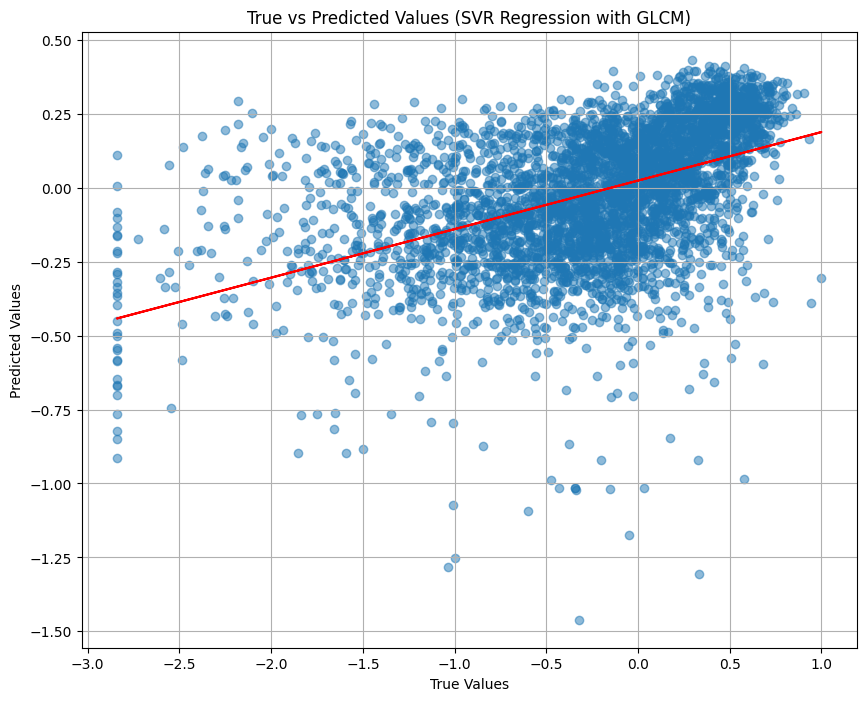

In [87]:
plot_regression_model(y_test, preds_svr_glcm, "True vs Predicted Values (SVR Regression with GLCM)")

In [88]:
regression_metrics_df

,Model Name,RMSE,R2 Score,Pearson Correlation,Spearman Correlation
0,OLS-PCA,0.739311,-0.247793,0.474041,0.510122
1,OLS-GLCM,0.658989,0.008610,0.205798,0.270421
2,OLS-TL,0.945535,-1.041000,0.006344,0.009417
3,MLP-PCA,2.229056,-10.343043,0.245175,0.257448
4,MLP-GLCM,0.603741,0.167873,0.439092,0.515921
5,MLP-TL,0.815844,-0.519505,0.000204,-0.008077
6,SVR-PCA,1.439605,-3.731235,0.005259,0.029335
7,SVR-GLCM,0.631649,0.089165,0.475743,0.548094


##### 2.1.3 SVR Regression with Transfer Learning

In [89]:
train_features_scaled = scaler.fit_transform(train_features)
test_features_scaled = scaler.transform(test_features)

In [90]:
svr_tl = SVR(kernel='rbf')
svr_tl.fit(train_features_scaled, train_labels)

preds_svr_tl = svr_tl.predict(test_features_scaled)

svr_train_score_tl = svr_tl.score(train_features_scaled, train_labels)
svr_test_score_tl = svr_tl.score(test_features_scaled, test_labels)

print(f"SVR Training Score (TL) : {svr_train_score_tl}")
print(f"SVR Test Score (TL) : {svr_test_score_tl}")

SVR Training Score (TL) : 0.7691848381207118
SVR Test Score (TL) : 0.2548834593295799


In [91]:
regression_metrics_df = evaluate_regression_model(y_test, preds_svr_tl, "SVR-TL", regression_metrics_df)

SVR-TL Evaluation:
RMSE: 0.7615
R2 Score: -0.32364589688386247
Pearson Correlation Coefficient: 0.0188
Spearman Correlation Coefficient: 0.0215



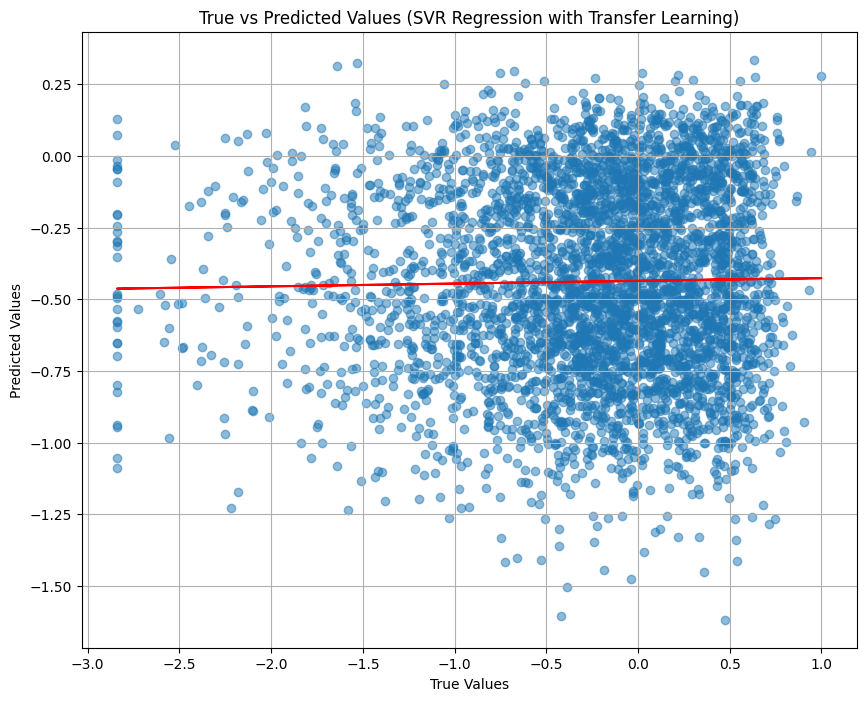

In [92]:
plot_regression_model(y_test, preds_svr_tl, "True vs Predicted Values (SVR Regression with Transfer Learning)")

In [93]:
regression_metrics_df

,Model Name,RMSE,R2 Score,Pearson Correlation,Spearman Correlation
0,OLS-PCA,0.739311,-0.247793,0.474041,0.510122
1,OLS-GLCM,0.658989,0.008610,0.205798,0.270421
2,OLS-TL,0.945535,-1.041000,0.006344,0.009417
3,MLP-PCA,2.229056,-10.343043,0.245175,0.257448
4,MLP-GLCM,0.603741,0.167873,0.439092,0.515921
5,MLP-TL,0.815844,-0.519505,0.000204,-0.008077
6,SVR-PCA,1.439605,-3.731235,0.005259,0.029335
7,SVR-GLCM,0.631649,0.089165,0.475743,0.548094
8,SVR-TL,0.761451,-0.323646,0.018801,0.021519


##### **Observations:**

- The model that stands out with respect to considerations to the metrics is **MLP-GLCM**. 

- It has relatively low RMSE (0.603741) and R2 score (0.167873) is positive and one of the highest as well. 

- The Pearson (0.439092) and Spearman (0.515921) Correlation Coefficient are relatively high, which shows a good predictive relationship between the models predictions and the actual values.

- This highlights the effectiveness of GLCM features in capturing the essential patterns and their strong correlation with the target variable.

- PCA features generally didn't perform well, which suggests that using PCA might lose some information that is information for predicting accurately.

- Transfer Learning models showed varied performance, with lower correlation scores. This indicates that these features might not be as directly correlated with the target variable or the information extracted might not be directly useful for the prediction task.

### Question No. 3 (Using Convolutional Neural Networks)

#### (i) Develop a Convolutional Neural Network (CNN) using PyTorch to predict the expression level of NESTIN from input images, following the approach outlined in part (ii) of Question (2). Design the architecture of the CNN to input an image and output a single value representing the NESTIN expression level. You have the freedom to select the structure of the network and the loss functions to be used. You can use pre-trained models and perform transfer learning if needed. Evaluate your model's performance on the test dataset by creating a scatter plot that compares the true vs. predicted NESTIN expression values. Additionally, quantify your model's accuracy using the following metrics:
- RMSE (Root Mean Square Error)
- Pearson Correlation Coefficient
- Spearman Correlation Coefficient
- R2 score


In [94]:
import torch.optim as optim
import torch.nn as nn

##### 3.1.1 A simple CNN Architecture for baseline predictions

In [95]:
class SimpleCNNProteinExpression(nn.Module):
    def __init__(self):
        super(SimpleCNNProteinExpression, self).__init__()
        self.conv_layers = nn.Sequential(
            nn.Conv2d(3, 16, kernel_size=3, stride=1, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Conv2d(16, 32, kernel_size=3, stride=1, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2),
        )

        self.fc_layers = nn.Sequential(
            nn.Linear(32 * 56 * 56, 128),
            nn.ReLU(),
            nn.Linear(128, 1),
        )

    def forward(self, x):
        x = self.conv_layers(x)
        x = x.view(x.size(0), -1)
        x = self.fc_layers(x)
        return x

In [96]:
class NESTINDataset(Dataset):
    def __init__(self, df, img_dir, transform=None):
        self.df = df
        self.img_dir = img_dir
        self.transform = transform

    def __len__(self):
        return len(self.df)
    
    def __getitem__(self, idx):
        img_name = f"{self.df.iloc[idx]['specimen_id']}_{self.df.iloc[idx]['id']}.png"
        img_path = os.path.join(self.img_dir, img_name)
        
        if not os.path.exists(img_path):
            print(f"Image {img_path} not found.")
            return None, None
        
        image = read_image(img_path)
        
        if self.transform:
            image = self.transform(image)
        
        return image, torch.tensor(self.df.iloc[idx]['NESTIN'], dtype=torch.float)


In [97]:
train_dataset = NESTINDataset(df_train, image_folder, transform=transform_pipeline)
test_dataset = NESTINDataset(df_test, image_folder, transform=transform_pipeline)

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)

In [98]:
device = torch.device("mps" if torch.backends.mps.is_available() else "cpu")
print(f"Using device: {device}")

Using device: mps


In [99]:
simpleCNN_model = SimpleCNNProteinExpression().to(device)
criterion = nn.MSELoss()
optimizer = optim.Adam(simpleCNN_model.parameters(), lr=0.001)

Epoch 1, Loss: 0.17830468714237213
Epoch 2, Loss: 0.21906602382659912
Epoch 3, Loss: 0.1963842809200287
Epoch 4, Loss: 0.10857183486223221
Epoch 5, Loss: 0.15182770788669586
Epoch 6, Loss: 0.17075788974761963
Epoch 7, Loss: 0.09707826375961304
Epoch 8, Loss: 0.08080814778804779
Epoch 9, Loss: 0.058234166353940964
Epoch 10, Loss: 0.041742004454135895


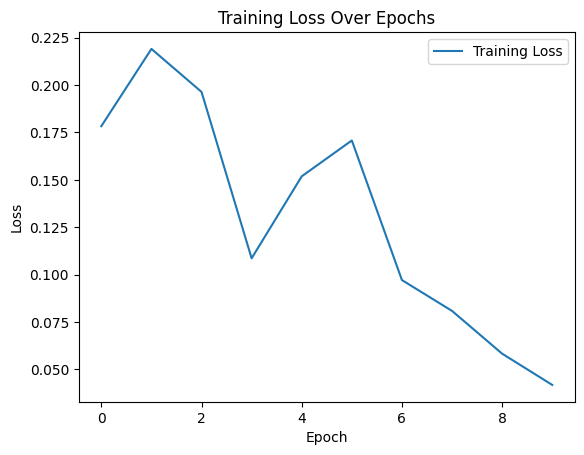

In [100]:
num_epochs = 10
train_losses = []

for epoch in range(num_epochs):
    simpleCNN_model.train()

    for images, labels in train_loader:
        images = images.to(device)
        labels = labels.float().to(device).unsqueeze(1)

        optimizer.zero_grad()
        outputs = simpleCNN_model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

    print(f"Epoch {epoch+1}, Loss: {loss.item()}")
    train_losses.append(loss.item())

plt.plot(train_losses, label='Training Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training Loss Over Epochs')
plt.legend()
plt.show()

In [101]:
def evaluate_nn_model(y_true, y_pred, model_name):
    y_true = y_true.flatten()
    y_pred = y_pred.flatten()
    
    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    r2 = r2_score(y_true, y_pred)
    pearson_corr, _ = pearsonr(y_true, y_pred)
    spearman_corr, _ = spearmanr(y_true, y_pred)
    
    print(f"{model_name} Evaluation:")
    print(f"RMSE: {rmse:.4f}")
    print(f"R2 Score: {r2:.4f}")
    print(f"Pearson Correlation Coefficient: {pearson_corr:.4f}")
    print(f"Spearman Correlation Coefficient: {spearman_corr:.4f}")


In [102]:
simpleCNN_model.eval()

actual = []
pred = []

with torch.no_grad():
    for images, labels in test_loader:
        images = images.to(device)
        labels = labels.float().to(device).unsqueeze(1)

        outputs = simpleCNN_model(images).squeeze()
        if outputs.dim() == 0:
            outputs = outputs.unsqueeze(0)
        
        outputs = outputs.cpu().numpy()
        labels = labels.cpu().numpy()

        actual.extend(labels.flatten())
        pred.extend(outputs.flatten())

actual = np.array(actual)
pred = np.array(pred)

evaluate_nn_model(actual, pred, "Simple CNN")

Simple CNN Evaluation:
RMSE: 0.6954
R2 Score: -0.1039
Pearson Correlation Coefficient: 0.3886
Spearman Correlation Coefficient: 0.4383


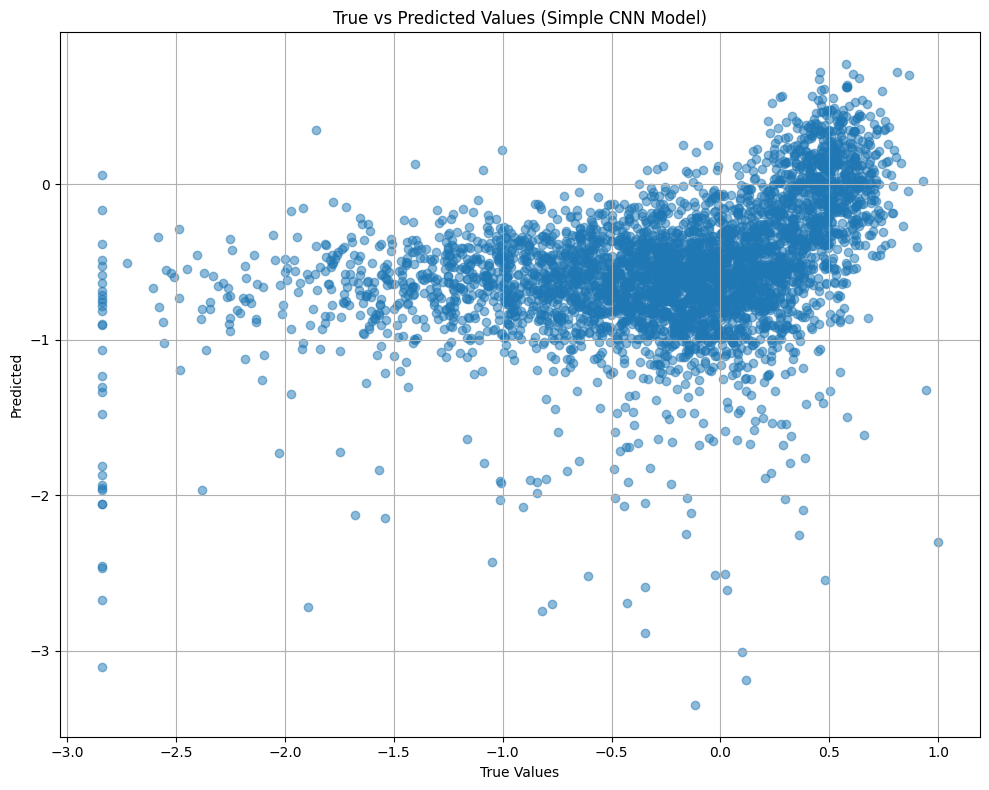

In [104]:
plt.figure(figsize=(10, 8))
plt.scatter(actual, pred, marker='o', alpha=0.5)
plt.title("True vs Predicted Values (Simple CNN Model)")
plt.xlabel('True Values')
plt.ylabel('Predicted')
plt.grid(True)
plt.tight_layout()
plt.show()

##### 3.1.2 Using pre-trained model ResNet v50

In [105]:
class ResNetProteinExpression(nn.Module):
    def __init__(self, pretrained=True, num_output_features=1):
        super(ResNetProteinExpression, self).__init__()
        self.resnet = models.resnet50(pretrained=pretrained)

        self.resnet = nn.Sequential(*list(self.resnet.children())[: -1])

        self.fc_layers = nn.Sequential(
            nn.Flatten(),
            nn.Linear(2048, 512),
            nn.ReLU(),
            nn.Dropout(0.5),
            nn.Linear(512, num_output_features)
        )

    def forward(self, x):
        x = self.resnet(x)
        x = self.fc_layers(x)
        return x

In [106]:
resnet_model = ResNetProteinExpression().to(device)

criterion_resnet = nn.MSELoss()
optimizer_resnet = optim.Adam(resnet_model.parameters(), lr=0.001)

/Users/adityamahamuni/anaconda3/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/Users/adityamahamuni/anaconda3/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1, Loss: 0.18831342458724976
Epoch 2, Loss: 0.15655991435050964
Epoch 3, Loss: 0.08156371116638184
Epoch 4, Loss: 0.07930687069892883
Epoch 5, Loss: 0.1877448856830597
Epoch 6, Loss: 0.11107727885246277
Epoch 7, Loss: 0.12506186962127686
Epoch 8, Loss: 0.09492561221122742
Epoch 9, Loss: 0.14145560562610626
Epoch 10, Loss: 0.11987683176994324


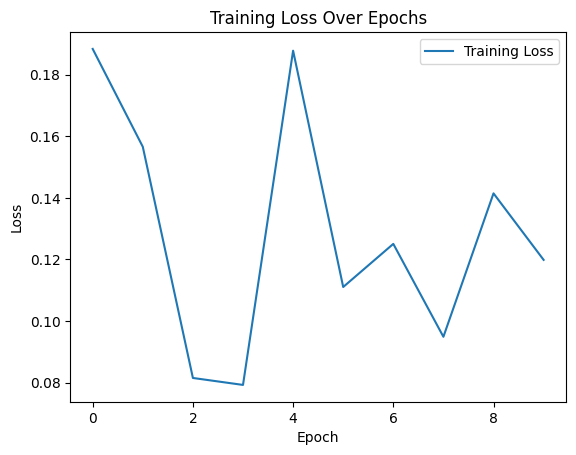

In [107]:
num_epochs = 10
train_losses = []

scheduler = torch.optim.lr_scheduler.StepLR(optimizer_resnet, step_size=30, gamma=0.1)

for epoch in range(num_epochs):
    resnet_model.train()

    for images, labels in train_loader:
        images = images.to(device)
        labels = labels.float().to(device).unsqueeze(1)

        optimizer_resnet.zero_grad()
        outputs = resnet_model(images)
        loss = criterion_resnet(outputs, labels)
        loss.backward()
        optimizer_resnet.step()

    print(f"Epoch {epoch+1}, Loss: {loss.item()}")
    train_losses.append(loss.item())
    scheduler.step()

plt.plot(train_losses, label='Training Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training Loss Over Epochs')
plt.legend()
plt.show()

In [108]:
resnet_model.eval()

actual = []
pred = []

with torch.no_grad():
    for images, labels in test_loader:
        images = images.to(device)
        labels = labels.float().to(device).unsqueeze(1)

        outputs = resnet_model(images).squeeze()
        if outputs.dim() == 0:
            outputs = outputs.unsqueeze(0)
        
        outputs = outputs.cpu().numpy()
        labels = labels.cpu().numpy()

        actual.extend(labels.flatten())
        pred.extend(outputs.flatten())

actual = np.array(actual)
pred = np.array(pred)

evaluate_nn_model(actual, pred, "ResNet CNN")

ResNet CNN Evaluation:
RMSE: 0.5892
R2 Score: 0.2076
Pearson Correlation Coefficient: 0.5311
Spearman Correlation Coefficient: 0.6468


##### 3.1.3 Fine-tuning ResNet Model

**References:** 
1. Revisiting ResNets: Improved Training and Scaling Strategies, Irwan Bello and William Fedus and Xianzhi Du and Ekin D. Cubuk and Aravind Srinivas and Tsung-Yi Lin and Jonathon Shlens and Barret Zoph, 2021, https://arxiv.org/abs/2103.07579.

In [125]:
class SqueezeExcitationLayer(nn.Module):
    def __init__(self, channel, reduction=16):
        super(SqueezeExcitationLayer, self).__init__()
        self.avg_pool = nn.AdaptiveAvgPool2d(1)
        self.fc = nn.Sequential(
            nn.Linear(channel, channel // reduction, bias=False),
            nn.ReLU(inplace=True),
            nn.Linear(channel // reduction, channel, bias=False),
            nn.Sigmoid()
        )

    def forward(self, x):
        b, c, _, _ = x.size()
        y = self.avg_pool(x).view(b, c)
        y = self.fc(y).view(b, c, 1, 1)
        return x * y.expand_as(x)

class ModifiedResNetProteinExpression(nn.Module):
    def __init__(self, pretrained=True, num_output_features=1):
        super(ModifiedResNetProteinExpression, self).__init__()
        original_resnet = models.resnet50(pretrained=pretrained)
        self.features = nn.Sequential(*list(original_resnet.children())[:-1])
        
        self.se_layer = SqueezeExcitationLayer(2048)
        
        self.classifier = nn.Sequential(
            nn.AdaptiveAvgPool2d((1, 1)),
            nn.Flatten(),
            nn.Linear(2048, 512),
            nn.ReLU(),
            nn.Dropout(0.5),
            nn.Linear(512, num_output_features)
        )

    def forward(self, x):
        x = self.features(x)
        x = self.se_layer(x)
        x = self.classifier(x)
        return x

In [126]:
modified_resnet_model = ModifiedResNetProteinExpression().to(device)
optimizer_modResNet = optim.AdamW(modified_resnet_model.parameters(), lr=0.001, weight_decay=1e-5)
scheduler_modResNet = torch.optim.lr_scheduler.StepLR(optimizer_modResNet, step_size=7, gamma=0.1)

/Users/adityamahamuni/anaconda3/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/Users/adityamahamuni/anaconda3/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [127]:
def train_one_epoch(model, dataloader, optimizer, device):
    model.train()
    running_loss = 0.0

    for images, labels in dataloader:
        images, labels = images.to(device), labels.to(device)

        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item() * images.size(0)
    return running_loss / len(dataloader.dataset)

def evaluate_model(model, dataloader, device):
    model.eval()
    running_loss = 0.0

    all_predictions = []
    all_labels = []

    with torch.no_grad():
        for images, labels in dataloader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            running_loss += loss.item() * images.size(0)
            all_predictions.extend(outputs.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
    
    return running_loss / len(dataloader.dataset), np.array(all_labels), np.array(all_predictions)

for epoch in range(num_epochs):
    train_loss = train_one_epoch(modified_resnet_model, train_loader, optimizer_modResNet, device)
    val_loss, labels, predictions = evaluate_model(modified_resnet_model, test_loader, device)
    print(f"Epoch {epoch+1}, Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}")
    scheduler_modResNet.step()


/Users/adityamahamuni/anaconda3/lib/python3.11/site-packages/torch/nn/modules/loss.py:535: UserWarning: Using a target size (torch.Size([32, 5])) that is different to the input size (torch.Size([32, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/adityamahamuni/anaconda3/lib/python3.11/site-packages/torch/nn/modules/loss.py:535: UserWarning: Using a target size (torch.Size([32, 5])) that is different to the input size (torch.Size([32, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/adityamahamuni/anaconda3/lib/python3.11/site-packages/torch/nn/modules/loss.py:535: UserWarning: Using a target size (torch.Size([32, 5])) that is different to the input size (torch.Size([32, 1])). This will likely lead to incorrect results due to broadca

Epoch 1, Train Loss: 0.7387, Val Loss: 0.7467


/Users/adityamahamuni/anaconda3/lib/python3.11/site-packages/torch/nn/modules/loss.py:535: UserWarning: Using a target size (torch.Size([32, 5])) that is different to the input size (torch.Size([32, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/adityamahamuni/anaconda3/lib/python3.11/site-packages/torch/nn/modules/loss.py:535: UserWarning: Using a target size (torch.Size([32, 5])) that is different to the input size (torch.Size([32, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/adityamahamuni/anaconda3/lib/python3.11/site-packages/torch/nn/modules/loss.py:535: UserWarning: Using a target size (torch.Size([32, 5])) that is different to the input size (torch.Size([32, 1])). This will likely lead to incorrect results due to broadca

Epoch 2, Train Loss: 0.5832, Val Loss: 0.7314


/Users/adityamahamuni/anaconda3/lib/python3.11/site-packages/torch/nn/modules/loss.py:535: UserWarning: Using a target size (torch.Size([32, 5])) that is different to the input size (torch.Size([32, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/adityamahamuni/anaconda3/lib/python3.11/site-packages/torch/nn/modules/loss.py:535: UserWarning: Using a target size (torch.Size([32, 5])) that is different to the input size (torch.Size([32, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/adityamahamuni/anaconda3/lib/python3.11/site-packages/torch/nn/modules/loss.py:535: UserWarning: Using a target size (torch.Size([32, 5])) that is different to the input size (torch.Size([32, 1])). This will likely lead to incorrect results due to broadca

Epoch 3, Train Loss: 0.5786, Val Loss: 0.7076


/Users/adityamahamuni/anaconda3/lib/python3.11/site-packages/torch/nn/modules/loss.py:535: UserWarning: Using a target size (torch.Size([32, 5])) that is different to the input size (torch.Size([32, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/adityamahamuni/anaconda3/lib/python3.11/site-packages/torch/nn/modules/loss.py:535: UserWarning: Using a target size (torch.Size([32, 5])) that is different to the input size (torch.Size([32, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/adityamahamuni/anaconda3/lib/python3.11/site-packages/torch/nn/modules/loss.py:535: UserWarning: Using a target size (torch.Size([32, 5])) that is different to the input size (torch.Size([32, 1])). This will likely lead to incorrect results due to broadca

Epoch 4, Train Loss: 0.5660, Val Loss: 0.7676


/Users/adityamahamuni/anaconda3/lib/python3.11/site-packages/torch/nn/modules/loss.py:535: UserWarning: Using a target size (torch.Size([32, 5])) that is different to the input size (torch.Size([32, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/adityamahamuni/anaconda3/lib/python3.11/site-packages/torch/nn/modules/loss.py:535: UserWarning: Using a target size (torch.Size([32, 5])) that is different to the input size (torch.Size([32, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/adityamahamuni/anaconda3/lib/python3.11/site-packages/torch/nn/modules/loss.py:535: UserWarning: Using a target size (torch.Size([32, 5])) that is different to the input size (torch.Size([32, 1])). This will likely lead to incorrect results due to broadca

Epoch 5, Train Loss: 0.5613, Val Loss: 0.7343


/Users/adityamahamuni/anaconda3/lib/python3.11/site-packages/torch/nn/modules/loss.py:535: UserWarning: Using a target size (torch.Size([32, 5])) that is different to the input size (torch.Size([32, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/adityamahamuni/anaconda3/lib/python3.11/site-packages/torch/nn/modules/loss.py:535: UserWarning: Using a target size (torch.Size([32, 5])) that is different to the input size (torch.Size([32, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/adityamahamuni/anaconda3/lib/python3.11/site-packages/torch/nn/modules/loss.py:535: UserWarning: Using a target size (torch.Size([32, 5])) that is different to the input size (torch.Size([32, 1])). This will likely lead to incorrect results due to broadca

Epoch 6, Train Loss: 0.5481, Val Loss: 0.7450


/Users/adityamahamuni/anaconda3/lib/python3.11/site-packages/torch/nn/modules/loss.py:535: UserWarning: Using a target size (torch.Size([32, 5])) that is different to the input size (torch.Size([32, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/adityamahamuni/anaconda3/lib/python3.11/site-packages/torch/nn/modules/loss.py:535: UserWarning: Using a target size (torch.Size([32, 5])) that is different to the input size (torch.Size([32, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/adityamahamuni/anaconda3/lib/python3.11/site-packages/torch/nn/modules/loss.py:535: UserWarning: Using a target size (torch.Size([32, 5])) that is different to the input size (torch.Size([32, 1])). This will likely lead to incorrect results due to broadca

Epoch 7, Train Loss: 0.5430, Val Loss: 0.7268


/Users/adityamahamuni/anaconda3/lib/python3.11/site-packages/torch/nn/modules/loss.py:535: UserWarning: Using a target size (torch.Size([32, 5])) that is different to the input size (torch.Size([32, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/adityamahamuni/anaconda3/lib/python3.11/site-packages/torch/nn/modules/loss.py:535: UserWarning: Using a target size (torch.Size([32, 5])) that is different to the input size (torch.Size([32, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/adityamahamuni/anaconda3/lib/python3.11/site-packages/torch/nn/modules/loss.py:535: UserWarning: Using a target size (torch.Size([32, 5])) that is different to the input size (torch.Size([32, 1])). This will likely lead to incorrect results due to broadca

Epoch 8, Train Loss: 0.4883, Val Loss: 0.7143


/Users/adityamahamuni/anaconda3/lib/python3.11/site-packages/torch/nn/modules/loss.py:535: UserWarning: Using a target size (torch.Size([32, 5])) that is different to the input size (torch.Size([32, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/adityamahamuni/anaconda3/lib/python3.11/site-packages/torch/nn/modules/loss.py:535: UserWarning: Using a target size (torch.Size([32, 5])) that is different to the input size (torch.Size([32, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/adityamahamuni/anaconda3/lib/python3.11/site-packages/torch/nn/modules/loss.py:535: UserWarning: Using a target size (torch.Size([32, 5])) that is different to the input size (torch.Size([32, 1])). This will likely lead to incorrect results due to broadca

Epoch 9, Train Loss: 0.4534, Val Loss: 0.7081


/Users/adityamahamuni/anaconda3/lib/python3.11/site-packages/torch/nn/modules/loss.py:535: UserWarning: Using a target size (torch.Size([32, 5])) that is different to the input size (torch.Size([32, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/adityamahamuni/anaconda3/lib/python3.11/site-packages/torch/nn/modules/loss.py:535: UserWarning: Using a target size (torch.Size([32, 5])) that is different to the input size (torch.Size([32, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/adityamahamuni/anaconda3/lib/python3.11/site-packages/torch/nn/modules/loss.py:535: UserWarning: Using a target size (torch.Size([32, 5])) that is different to the input size (torch.Size([32, 1])). This will likely lead to incorrect results due to broadca

Epoch 10, Train Loss: 0.4265, Val Loss: 0.7193


/Users/adityamahamuni/anaconda3/lib/python3.11/site-packages/torch/nn/modules/loss.py:535: UserWarning: Using a target size (torch.Size([1, 5])) that is different to the input size (torch.Size([1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


In [129]:
actual = np.array(labels).flatten()
pred = np.array(predictions).flatten()

# Calculate and print metrics
rmse = np.sqrt(mean_squared_error(actual, pred))
r2 = r2_score(actual, pred)
pearson_corr, _ = pearsonr(actual, pred)
spearman_corr, _ = spearmanr(actual, pred)

print(f"RMSE: {rmse}")
print(f"R2 Score: {r2}")
print(f"Pearson Correlation Coefficient: {pearson_corr}")
print(f"Spearman Correlation Coefficient: {spearman_corr}")

**Observations:**

- Overall, the ResNet CNN model significantly performs better than the simple CNN architecture across all the metrics.
- As the simpleCNN architecture is used just for baseline evaluation, it confirms that the ResNet model works better in predicting the values. 
- The ResNet model has lower RSME and fits the data better with a higher R2 score.
- It also has a stronger correlations between actual and predicted values indicated by higher Pearson and Spearman correlation coefficients.

#### (ii) Create a neural network using PyTorch to simultaneously predict the expression levels of five specific proteins (EGFR, PTEN, NESTIN, SOX2, and MET) from given image patches. You have the flexibility to choose the architecture of the neural network and the loss functions you deem appropriate for this task. For model validation, employ a "leave one specimen out cross-validation" strategy. This approach involves sequentially using data from one specimen as the test set and the combined data from the remaining specimens as the training set. This method is similar to a 4-fold cross-validation but specifically tailored to ensure that each specimen is used as a test set exactly once. This validation technique ensures that your model's performance is evaluated on entirely unseen data, mimicking a scenario where the model is tested on data from a new specimen. For a practical understanding of how this is implemented, you can refer to the GroupKFold method in scikit-learn. After training and validating your model, create a total of 20 scatter plots to visually represent your results. These plots should compare the predicted versus actual expression levels for each of the five proteins across the four specimens. This means you'll generate one plot for each protein per specimen. Finally, quantify the performance of your optimal model for each protein with the following statistical metrics:
- RMSE (Root Mean Square Error): Measures the model's prediction error.
- Pearson Correlation Coefficient: Assesses the linear relationship between predicted and actual values.
- Spearman Correlation Coefficient: Evaluates the monotonic relationship between
predicted and actual values.
- R2 Score: Indicates the proportion of variance in the dependent variable predictable from the independent variable(s).

For each metric, report both the average and standard deviation across the specimens for every target protein. 

This comprehensive evaluation will help in understanding the model's predictive
accuracy, reliability, and the nature of its errors or biases.


HINT:
A naïve (but possibly effective) strategy can be to simply try the same network
architecture in 3(a) and train different models separately for each target variable.

In [109]:
class ProteinDataset(Dataset):
    def __init__(self, df, img_dir, protein_name, transform=None):
        self.df = df
        self.img_dir = img_dir
        self.protein_name = protein_name
        self.transform = transform

    def __len__(self):
        return len(self.df)
    
    def __getitem__(self, idx):
        img_name = f"{self.df.iloc[idx]['specimen_id']}_{self.df.iloc[idx]['id']}.png"
        img_path = os.path.join(self.img_dir, img_name)
        
        if not os.path.exists(img_path):
            print(f"Image {img_path} not found.")
            return torch.zeros(3, 224, 224), torch.zeros(1)
        
        image = read_image(img_path)
        
        if self.transform:
            image = self.transform(image)

        labels = torch.tensor(self.df.iloc[idx][self.protein_name], dtype=torch.float)
        
        return image, labels

In [110]:
train_dataset = ProteinDataset(df_train, image_folder, ['EGFR', 'PTEN', 'NESTIN', 'SOX2', 'MET'], transform=transform_pipeline)
test_dataset = ProteinDataset(df_test, image_folder, ['EGFR', 'PTEN', 'NESTIN', 'SOX2', 'MET'], transform=transform_pipeline)

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)

In [112]:
resnet_model_multidata = ResNetProteinExpression(num_output_features=5).to(device)

criterion_multidata = nn.MSELoss()
optimizer_multidata = optim.Adam(resnet_model_multidata.parameters(), lr=0.001)


/Users/adityamahamuni/anaconda3/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/Users/adityamahamuni/anaconda3/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


/Users/adityamahamuni/anaconda3/lib/python3.11/site-packages/torch/nn/modules/loss.py:535: UserWarning: Using a target size (torch.Size([32, 1, 5])) that is different to the input size (torch.Size([32, 5])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/adityamahamuni/anaconda3/lib/python3.11/site-packages/torch/nn/modules/loss.py:535: UserWarning: Using a target size (torch.Size([32, 1, 5])) that is different to the input size (torch.Size([32, 5])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/adityamahamuni/anaconda3/lib/python3.11/site-packages/torch/nn/modules/loss.py:535: UserWarning: Using a target size (torch.Size([32, 1, 5])) that is different to the input size (torch.Size([32, 5])). This will likely lead to incorrect results due t

Epoch 1, Loss: 0.5123991370201111


/Users/adityamahamuni/anaconda3/lib/python3.11/site-packages/torch/nn/modules/loss.py:535: UserWarning: Using a target size (torch.Size([32, 1, 5])) that is different to the input size (torch.Size([32, 5])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/adityamahamuni/anaconda3/lib/python3.11/site-packages/torch/nn/modules/loss.py:535: UserWarning: Using a target size (torch.Size([32, 1, 5])) that is different to the input size (torch.Size([32, 5])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/adityamahamuni/anaconda3/lib/python3.11/site-packages/torch/nn/modules/loss.py:535: UserWarning: Using a target size (torch.Size([32, 1, 5])) that is different to the input size (torch.Size([32, 5])). This will likely lead to incorrect results due t

Epoch 2, Loss: 0.41452914476394653


/Users/adityamahamuni/anaconda3/lib/python3.11/site-packages/torch/nn/modules/loss.py:535: UserWarning: Using a target size (torch.Size([32, 1, 5])) that is different to the input size (torch.Size([32, 5])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/adityamahamuni/anaconda3/lib/python3.11/site-packages/torch/nn/modules/loss.py:535: UserWarning: Using a target size (torch.Size([32, 1, 5])) that is different to the input size (torch.Size([32, 5])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/adityamahamuni/anaconda3/lib/python3.11/site-packages/torch/nn/modules/loss.py:535: UserWarning: Using a target size (torch.Size([32, 1, 5])) that is different to the input size (torch.Size([32, 5])). This will likely lead to incorrect results due t

Epoch 3, Loss: 0.5626670122146606


/Users/adityamahamuni/anaconda3/lib/python3.11/site-packages/torch/nn/modules/loss.py:535: UserWarning: Using a target size (torch.Size([32, 1, 5])) that is different to the input size (torch.Size([32, 5])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/adityamahamuni/anaconda3/lib/python3.11/site-packages/torch/nn/modules/loss.py:535: UserWarning: Using a target size (torch.Size([32, 1, 5])) that is different to the input size (torch.Size([32, 5])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/adityamahamuni/anaconda3/lib/python3.11/site-packages/torch/nn/modules/loss.py:535: UserWarning: Using a target size (torch.Size([32, 1, 5])) that is different to the input size (torch.Size([32, 5])). This will likely lead to incorrect results due t

Epoch 4, Loss: 0.4240613877773285


/Users/adityamahamuni/anaconda3/lib/python3.11/site-packages/torch/nn/modules/loss.py:535: UserWarning: Using a target size (torch.Size([32, 1, 5])) that is different to the input size (torch.Size([32, 5])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/adityamahamuni/anaconda3/lib/python3.11/site-packages/torch/nn/modules/loss.py:535: UserWarning: Using a target size (torch.Size([32, 1, 5])) that is different to the input size (torch.Size([32, 5])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/adityamahamuni/anaconda3/lib/python3.11/site-packages/torch/nn/modules/loss.py:535: UserWarning: Using a target size (torch.Size([32, 1, 5])) that is different to the input size (torch.Size([32, 5])). This will likely lead to incorrect results due t

Epoch 5, Loss: 0.8377463221549988


/Users/adityamahamuni/anaconda3/lib/python3.11/site-packages/torch/nn/modules/loss.py:535: UserWarning: Using a target size (torch.Size([32, 1, 5])) that is different to the input size (torch.Size([32, 5])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/adityamahamuni/anaconda3/lib/python3.11/site-packages/torch/nn/modules/loss.py:535: UserWarning: Using a target size (torch.Size([32, 1, 5])) that is different to the input size (torch.Size([32, 5])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/adityamahamuni/anaconda3/lib/python3.11/site-packages/torch/nn/modules/loss.py:535: UserWarning: Using a target size (torch.Size([32, 1, 5])) that is different to the input size (torch.Size([32, 5])). This will likely lead to incorrect results due t

Epoch 6, Loss: 1.2601873874664307


/Users/adityamahamuni/anaconda3/lib/python3.11/site-packages/torch/nn/modules/loss.py:535: UserWarning: Using a target size (torch.Size([32, 1, 5])) that is different to the input size (torch.Size([32, 5])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/adityamahamuni/anaconda3/lib/python3.11/site-packages/torch/nn/modules/loss.py:535: UserWarning: Using a target size (torch.Size([32, 1, 5])) that is different to the input size (torch.Size([32, 5])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/adityamahamuni/anaconda3/lib/python3.11/site-packages/torch/nn/modules/loss.py:535: UserWarning: Using a target size (torch.Size([32, 1, 5])) that is different to the input size (torch.Size([32, 5])). This will likely lead to incorrect results due t

Epoch 7, Loss: 0.790017306804657


/Users/adityamahamuni/anaconda3/lib/python3.11/site-packages/torch/nn/modules/loss.py:535: UserWarning: Using a target size (torch.Size([32, 1, 5])) that is different to the input size (torch.Size([32, 5])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/adityamahamuni/anaconda3/lib/python3.11/site-packages/torch/nn/modules/loss.py:535: UserWarning: Using a target size (torch.Size([32, 1, 5])) that is different to the input size (torch.Size([32, 5])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/adityamahamuni/anaconda3/lib/python3.11/site-packages/torch/nn/modules/loss.py:535: UserWarning: Using a target size (torch.Size([32, 1, 5])) that is different to the input size (torch.Size([32, 5])). This will likely lead to incorrect results due t

Epoch 8, Loss: 0.6601577997207642


/Users/adityamahamuni/anaconda3/lib/python3.11/site-packages/torch/nn/modules/loss.py:535: UserWarning: Using a target size (torch.Size([32, 1, 5])) that is different to the input size (torch.Size([32, 5])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/adityamahamuni/anaconda3/lib/python3.11/site-packages/torch/nn/modules/loss.py:535: UserWarning: Using a target size (torch.Size([32, 1, 5])) that is different to the input size (torch.Size([32, 5])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/adityamahamuni/anaconda3/lib/python3.11/site-packages/torch/nn/modules/loss.py:535: UserWarning: Using a target size (torch.Size([32, 1, 5])) that is different to the input size (torch.Size([32, 5])). This will likely lead to incorrect results due t

Epoch 9, Loss: 0.7200064063072205


/Users/adityamahamuni/anaconda3/lib/python3.11/site-packages/torch/nn/modules/loss.py:535: UserWarning: Using a target size (torch.Size([32, 1, 5])) that is different to the input size (torch.Size([32, 5])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/adityamahamuni/anaconda3/lib/python3.11/site-packages/torch/nn/modules/loss.py:535: UserWarning: Using a target size (torch.Size([32, 1, 5])) that is different to the input size (torch.Size([32, 5])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/Users/adityamahamuni/anaconda3/lib/python3.11/site-packages/torch/nn/modules/loss.py:535: UserWarning: Using a target size (torch.Size([32, 1, 5])) that is different to the input size (torch.Size([32, 5])). This will likely lead to incorrect results due t

Epoch 10, Loss: 0.6784417033195496


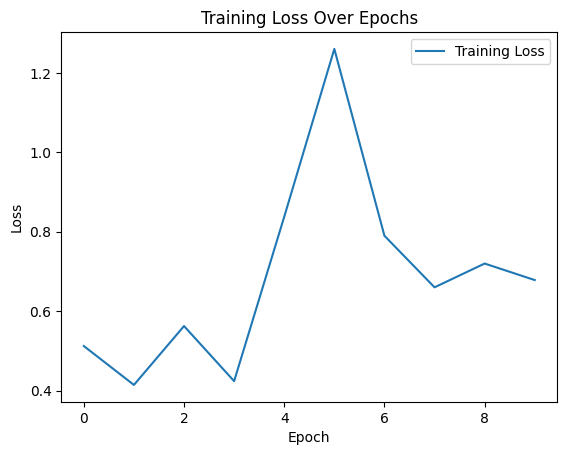

In [113]:
num_epochs = 10
train_losses = []

scheduler = torch.optim.lr_scheduler.StepLR(optimizer_multidata, step_size=30, gamma=0.1)

for epoch in range(num_epochs):
    resnet_model_multidata.train()

    for images, labels in train_loader:
        images = images.to(device)
        labels = labels.float().to(device).unsqueeze(1)

        optimizer_multidata.zero_grad()
        outputs = resnet_model_multidata(images)
        loss = criterion_multidata(outputs, labels)
        loss.backward()
        optimizer_multidata.step()

    print(f"Epoch {epoch+1}, Loss: {loss.item()}")
    train_losses.append(loss.item())
    scheduler.step()

plt.plot(train_losses, label='Training Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training Loss Over Epochs')
plt.legend()
plt.show()

In [114]:
resnet_model_multidata.eval()

actuals = []
predictions = []

with torch.no_grad():
    for images, labels in test_loader:
        images = images.to(device)
        labels = labels.float().to(device)

        outputs = resnet_model_multidata(images).squeeze()

        if outputs.dim() > 1:
            outputs = outputs.squeeze()
        
        if outputs.dim() == 1:
            outputs = outputs.unsqueeze(0)
        
        outputs_np = outputs.cpu().numpy()
        labels_np = labels.cpu().numpy()
        
        actuals.append(labels_np)
        predictions.append(outputs_np)

actuals_np = np.concatenate(actuals, axis=0)
predictions_np = np.concatenate(predictions, axis=0)

In [115]:
proteins = ['EGFR', 'PTEN', 'NESTIN', 'SOX2', 'MET']

In [116]:
for i, protein in enumerate(proteins):
    rmse = np.sqrt(((actuals_np[:, i] - predictions_np[:, i]) ** 2).mean())
    pearson_corr, _ = pearsonr(actuals_np[:, i], predictions_np[:, i])
    
    print(f"{protein} - RMSE: {rmse:.4f}, Pearson Correlation: {pearson_corr:.4f}")


EGFR - RMSE: 0.1810, Pearson Correlation: 0.0521
PTEN - RMSE: 1.1689, Pearson Correlation: -0.0116
NESTIN - RMSE: 0.6777, Pearson Correlation: 0.0244
SOX2 - RMSE: 1.0064, Pearson Correlation: 0.0330
MET - RMSE: 1.0778, Pearson Correlation: -0.0358


In [117]:
resnet_model_multidata.eval()
train_actuals = []
train_predictions = []

with torch.no_grad():
    for images, labels in train_loader:
        images = images.to(device)
        labels = labels.to(device)

        outputs = resnet_model_multidata(images).squeeze()

        if outputs.dim() < 2:
            outputs = outputs.unsqueeze(-1)

        train_actuals.append(labels.cpu().numpy())
        train_predictions.append(outputs.cpu().numpy())

train_actuals_np = np.concatenate(train_actuals, axis=0)
train_predictions_np = np.concatenate(train_predictions, axis=0)


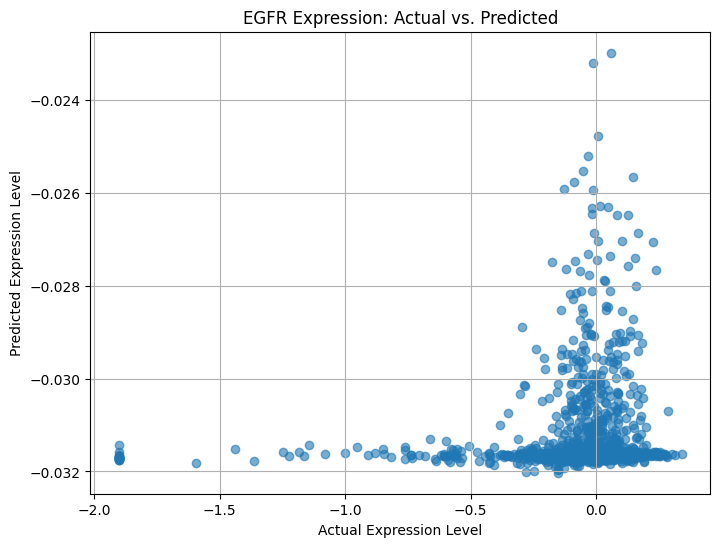

Protein: EGFR
RMSE: 0.1810
Pearson Correlation: 0.0521



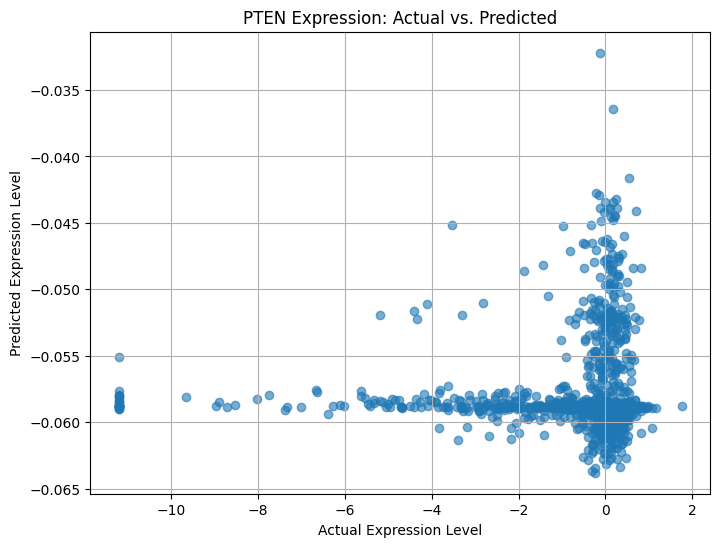

Protein: PTEN
RMSE: 1.1689
Pearson Correlation: -0.0116



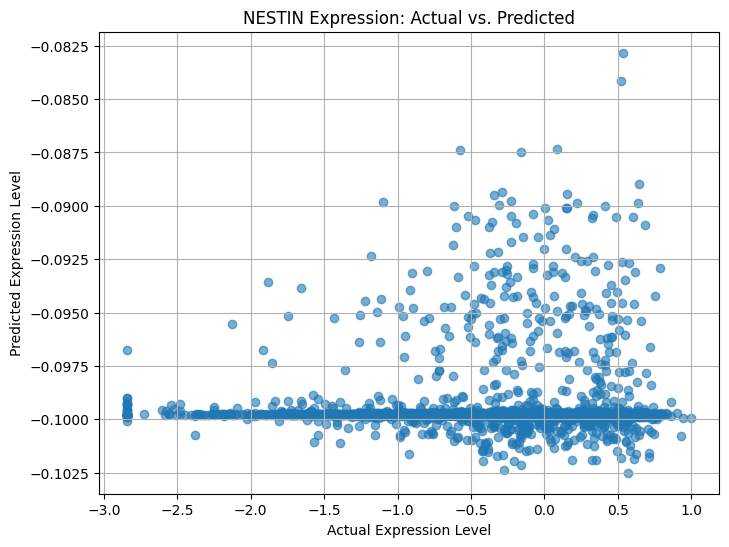

Protein: NESTIN
RMSE: 0.6777
Pearson Correlation: 0.0244



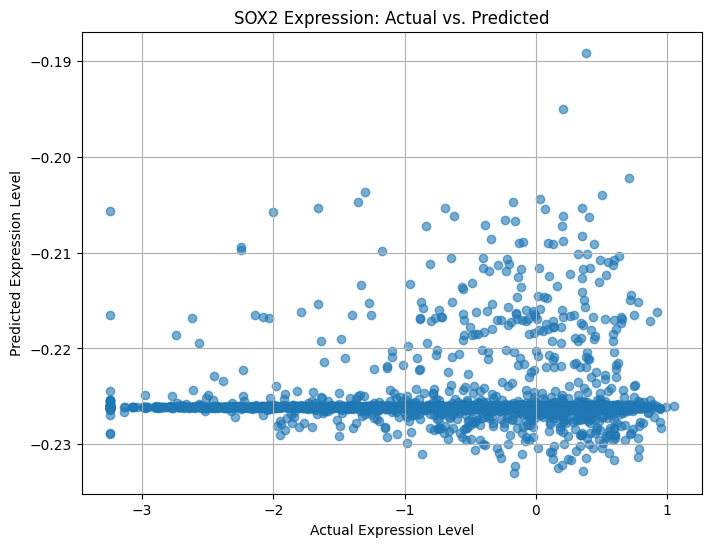

Protein: SOX2
RMSE: 1.0064
Pearson Correlation: 0.0330



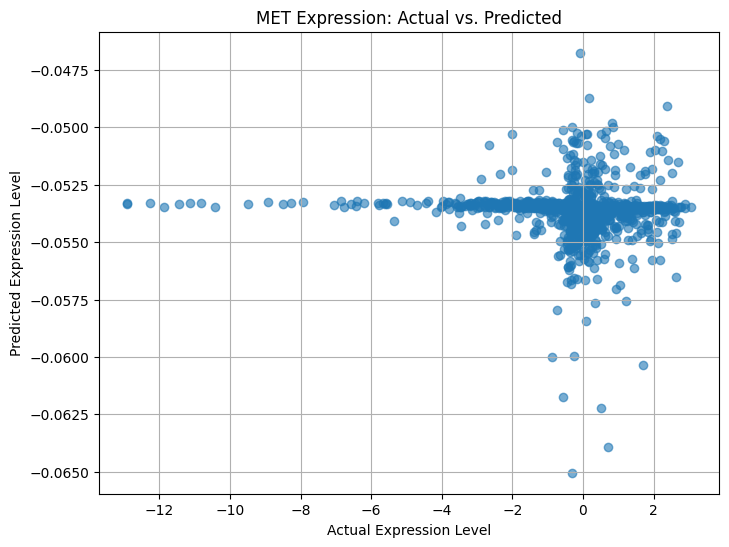

Protein: MET
RMSE: 1.0778
Pearson Correlation: -0.0358



In [118]:
proteins = ['EGFR', 'PTEN', 'NESTIN', 'SOX2', 'MET']

for i, protein in enumerate(proteins):
    plt.figure(figsize=(8, 6))
    plt.scatter(actuals_np[:, i], predictions_np[:, i], alpha=0.6)
    plt.title(f'{protein} Expression: Actual vs. Predicted')
    plt.xlabel('Actual Expression Level')
    plt.ylabel('Predicted Expression Level')
    plt.grid(True)
    plt.show()

    # Calculate performance metrics per protein
    rmse = np.sqrt(np.mean((actuals_np[:, i] - predictions_np[:, i]) ** 2))
    correlation_matrix = np.corrcoef(actuals_np[:, i], predictions_np[:, i])
    correlation = correlation_matrix[0, 1]
    print(f"Protein: {protein}")
    print(f"RMSE: {rmse:.4f}")
    print(f"Pearson Correlation: {correlation:.4f}\n")


In [119]:
train_specimens = ['A1', 'B1', 'D1']
proteins = ['EGFR', 'PTEN', 'NESTIN', 'SOX2', 'MET']

train_actuals_predictions_data = {specimen: {protein: ([], []) for protein in proteins} for specimen in train_specimens}

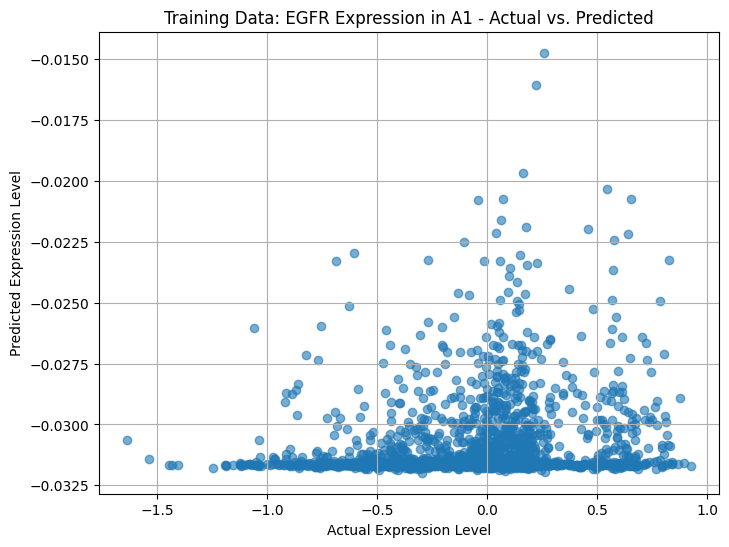

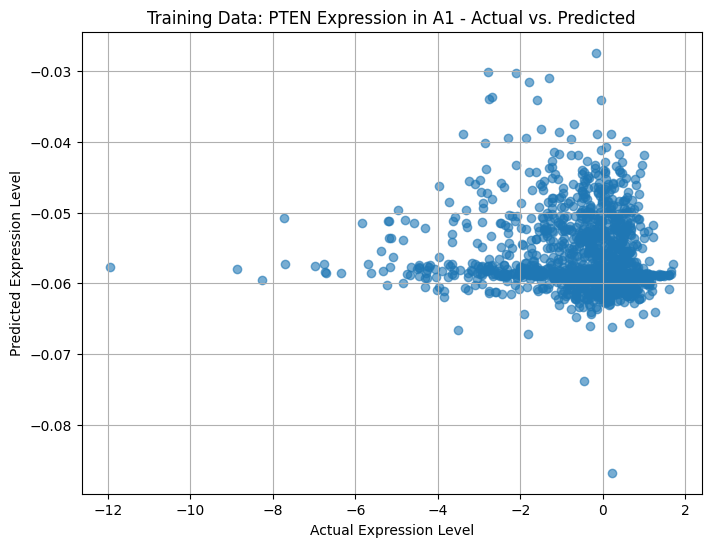

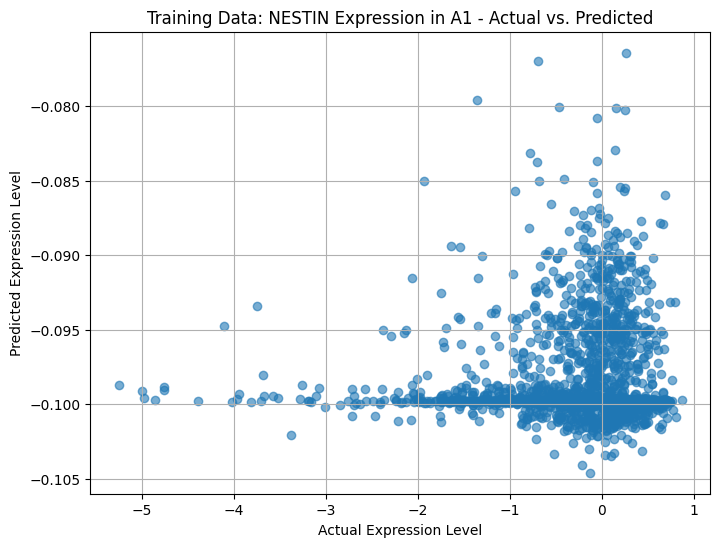

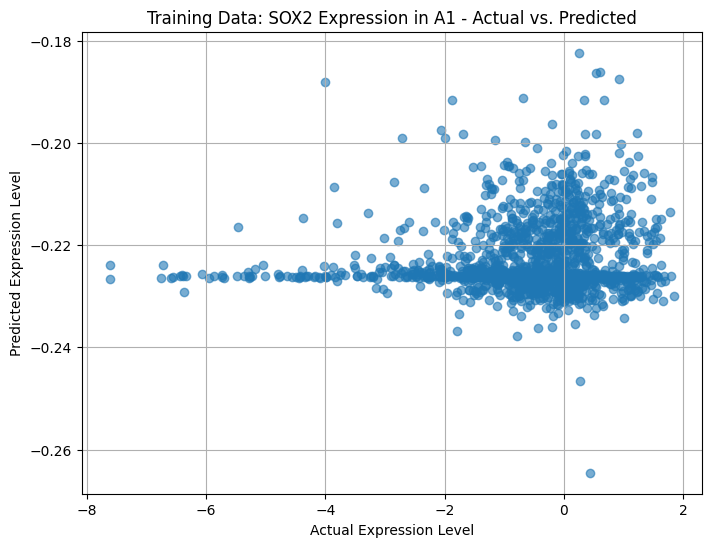

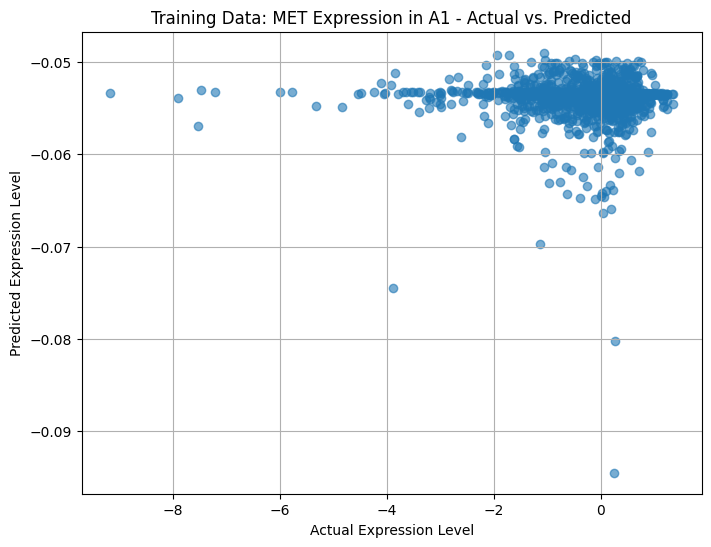

...

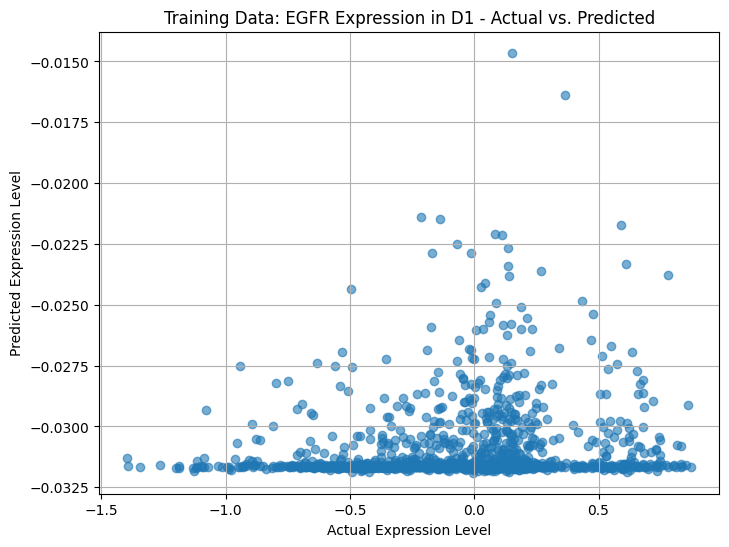

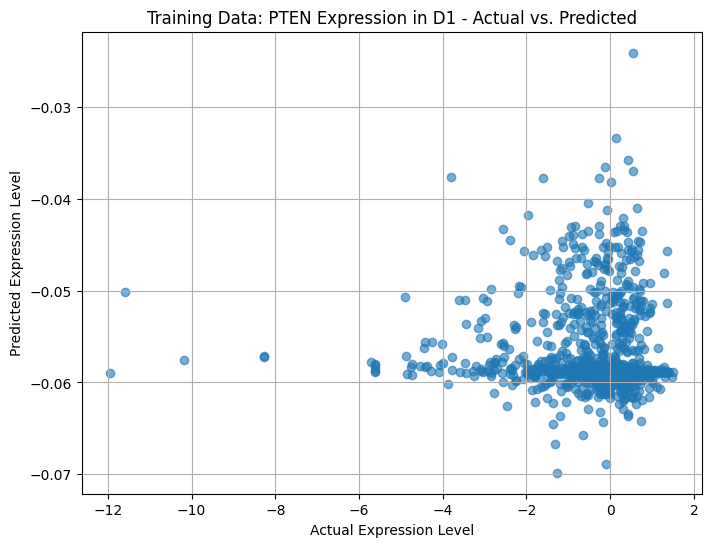

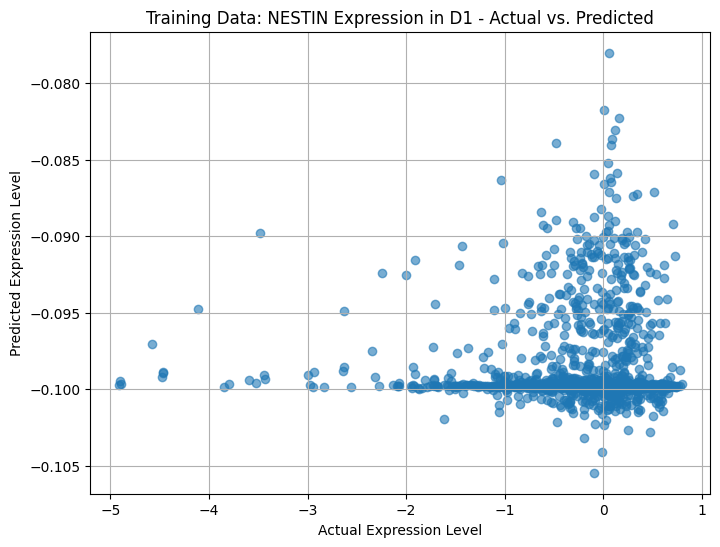

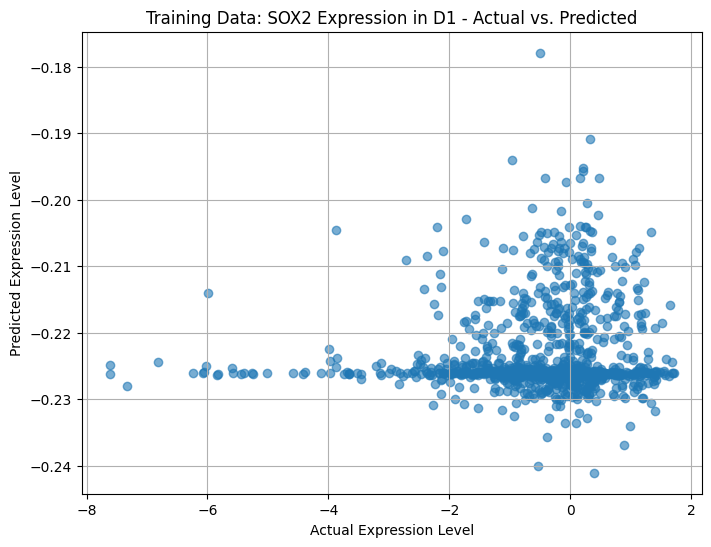

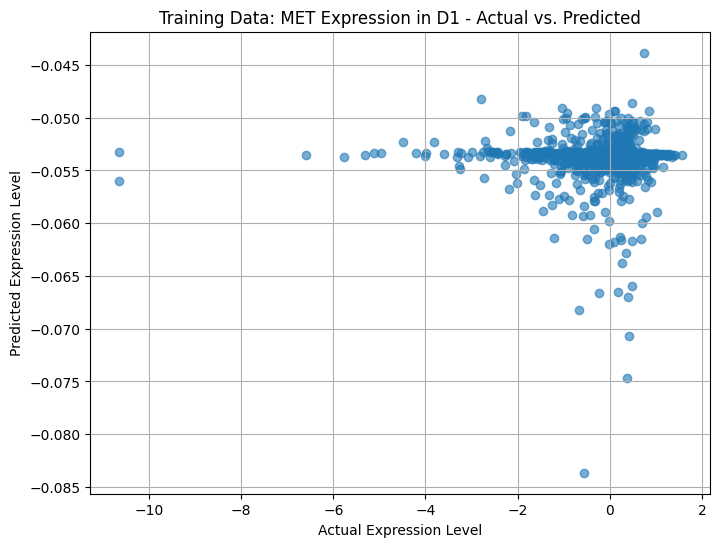

In [120]:
# Train Data
for i in range(len(df_train)):
    row = df_train.iloc[i]
train_actuals_predictions_data = {specimen: {protein: ([], []) for protein in proteins} for specimen in train_specimens}

for i in range(len(df_train)):
    row = df_train.iloc[i]
    specimen_id = row['specimen_id']
    for j, protein in enumerate(proteins):
        actual = train_actuals_np[i, j]
        prediction = train_predictions_np[i, j]
        train_actuals_predictions_data[specimen_id][protein][0].append(actual)
        train_actuals_predictions_data[specimen_id][protein][1].append(prediction)

for specimen in train_specimens:
    for protein in proteins:
        actuals, predictions = train_actuals_predictions_data[specimen][protein]
        plt.figure(figsize=(8, 6))
        plt.scatter(actuals, predictions, alpha=0.6)
        plt.title(f'Training Data: {protein} Expression in {specimen} - Actual vs. Predicted')
        plt.xlabel('Actual Expression Level')
        plt.ylabel('Predicted Expression Level')
        plt.grid(True)
        plt.show()


In [121]:
test_specimens = ['C1']
proteins = ['EGFR', 'PTEN', 'NESTIN', 'SOX2', 'MET']

test_actuals_predictions_data = {specimen: {protein: ([], []) for protein in proteins} for specimen in test_specimens}

In [122]:
for i in range(len(df_test)):
    row = df_test.iloc[i]
    specimen_id = row['specimen_id']
    for j, protein in enumerate(proteins):
        actual = row[protein]
        prediction = predictions_np[i, j]
        test_actuals_predictions_data[specimen_id][protein][0].append(actual)
        test_actuals_predictions_data[specimen_id][protein][1].append(prediction)

for specimen in test_actuals_predictions_data:
    for protein in test_actuals_predictions_data[specimen]:
        actuals, predictions = test_actuals_predictions_data[specimen][protein]
        test_actuals_predictions_data[specimen][protein] = (np.array(actuals), np.array(predictions))

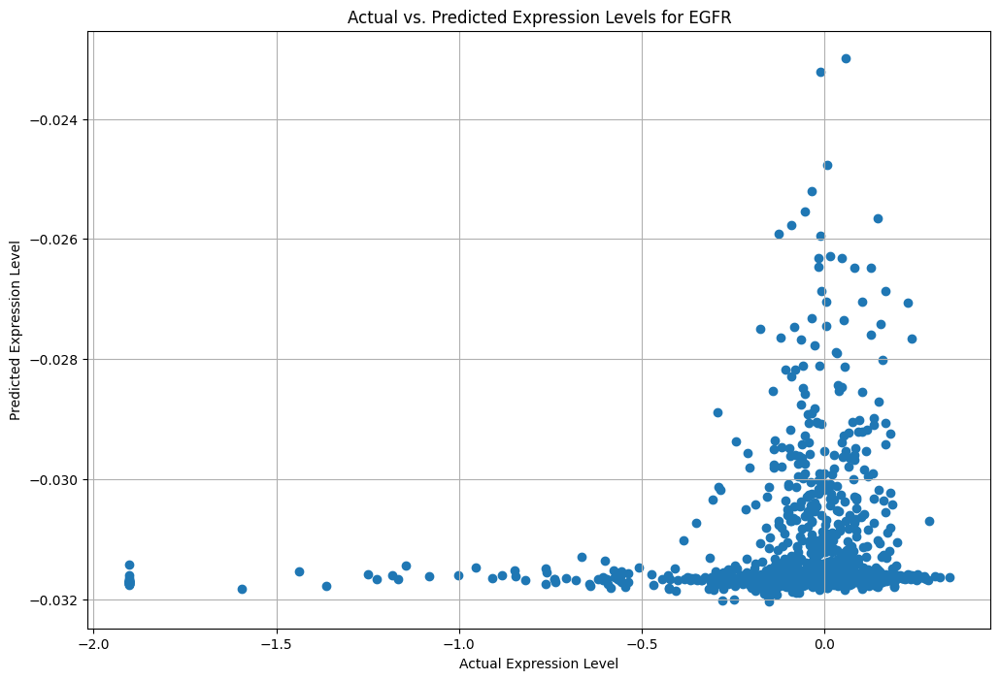

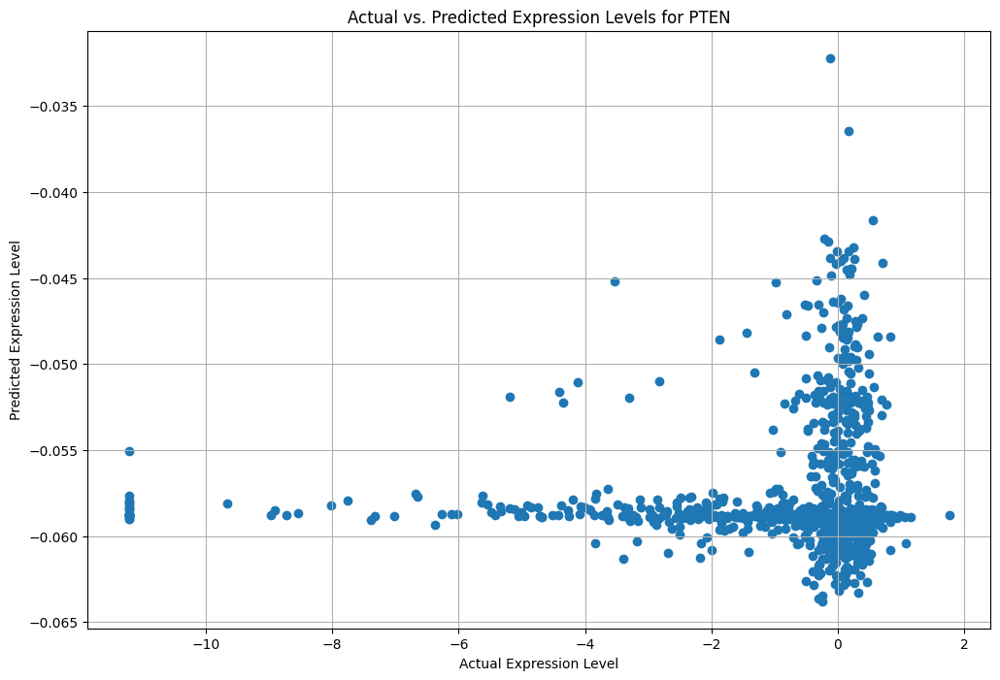

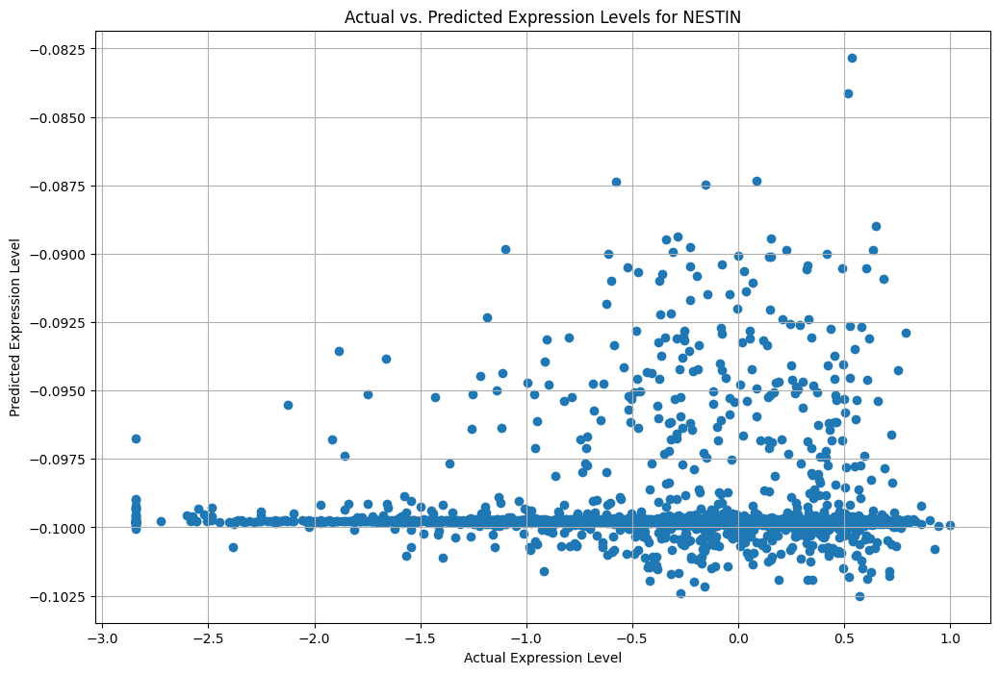

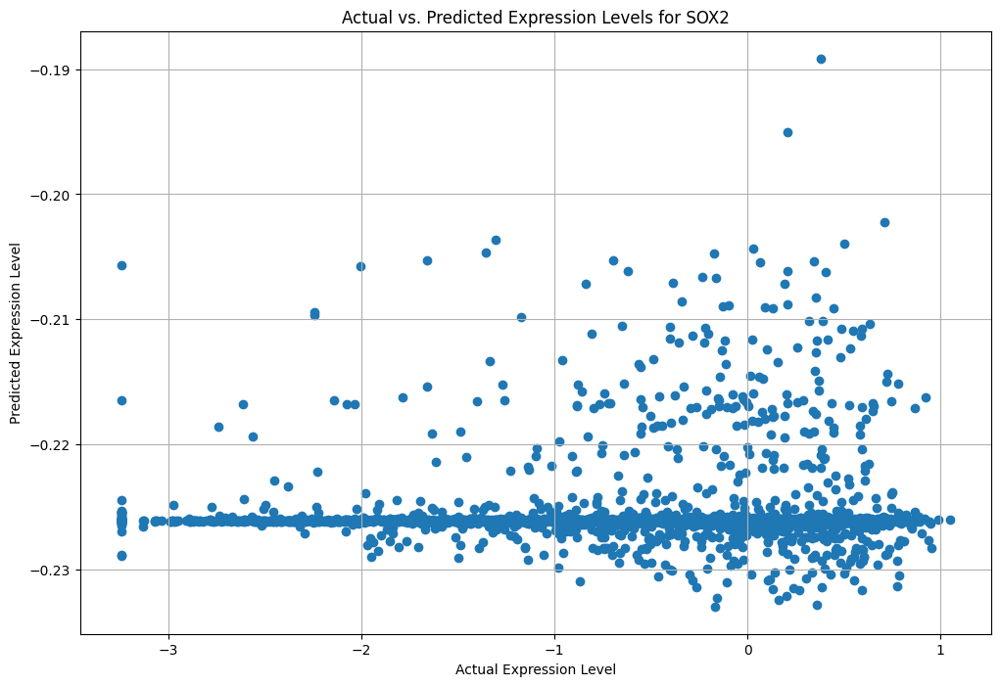

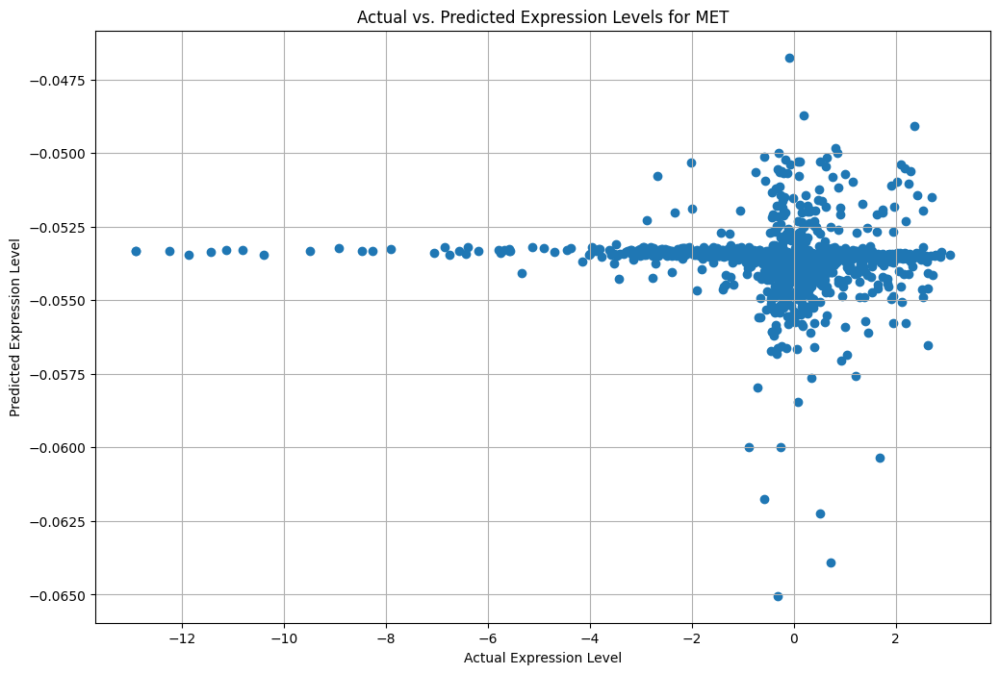

In [124]:
test_specimens = ['C1']

for protein in proteins:
    plt.figure(figsize=(12, 8))
    for specimen in test_specimens:
        actuals, predictions = test_actuals_predictions_data[specimen][protein]
        plt.scatter(actuals, predictions, label=f'Specimen {specimen}')
    
    plt.title(f'Actual vs. Predicted Expression Levels for {protein}')
    plt.xlabel('Actual Expression Level')
    plt.ylabel('Predicted Expression Level')
    plt.grid(True)
    plt.show()


#### iii) Discuss limitations and possible extensions of the optimal pipeline, e.g., is there any additional information we can utilize to improve prediction performance and how that can be used?

**Limitations:**

- PCA and GLCM can provide a way to reduce dimensionality and extract the features necessary, but they might not be able to capture all the relevant information that might be present in these images. Deeper tissue characteristics or other relationships might be overlooked in these cases.
- OLS regression assumes the data has a linear relationship, but this might not hold true for all the proteins in all the conditions.
- The size of features combined with the number of variables and layers in a neural network might make it computationally intensive.

**Possible Extensions:**

- While the transfer learning has been implemented, there is potential to leverage larger pre-trained models that can enhance prediction accuracy results.
- Data augmentation is another area that can be explored. To add diversity to the data, the images can be rotated, flipped or trimmed to provide additional training examples from the already existing images. This could improve robustness of the model.
- There is potential to include ensemble methods which combine the predictions from multiple models which might lead to better predictive performance.
- Regularization techniques can help mitigate overfitting if any and provide models that will generalize better.